# **<font color='crimson'>ПРОЕКТ «Прогнозирование исхода лечения цирроза печени - Prediction of Cirrhosis Outcomes»</font>**

---

**Выполнил**: Юмаев Егор

---

## <font color='green'>**ВВЕДЕНИЕ. ОПИСАНИЕ ПРОЕКТА, ЕГО ЦЕЛЬ И ЗАДАЧИ**</font>

---

Цирроз возникает в результате длительного поражения печени, приводящего к обширному рубцеванию, часто из-за таких заболеваний, как гепатит или хроническое употребление алкоголя. Приведенные данные взяты из исследования клиники Майо по первичному билиарному циррозу (ПБЦ) печени.

В распоряжении имеется датасет с 17-ю клиническими признаками по каждому пациенту с циррозом печени для предсказания его статуса:

* 'C' (censored) – пациент был жив в течении количества наблюдаемых дней, указанного в признаке 'N_Days'

* 'CL' (censored due to liver transplantation) – пациент был жив благодаря трансплантации печени в течении количества наблюдаемых дней, указанного в признаке 'N_Days'

* 'D' (death) – пациент умер


**Цель** – используя мультиклассовый подход предсказать вероятность исхода лечения пациентов с циррозом печени.

Для достижения цели были решены следующие **задачи**:

 * данные проверены на наличие пропусков, явные дубликаты, выбросы;

 * выбросы обработаны;

 * признаки проверены на мультиколлинеарность;

 * даныне подготовлены для сжати с помощью алгоритмов PCA, LDA, t-SNE;

 * проведена оценка требуемого для машинного обучения количества главных компонент для применения PCA;

 * данные высокой размерности представлены в 2D с помощью алгоритмов PCA, LDA, t-SNE;

 * проведено обучение моделей CatBoost и XGBoost как с применением классических подходов обработки данных с помощью Pipeline, так и с помощью алгоритмов сжатия данных PCA и LDA, подготовлены csv-файлы для серии сабмитов.

Решаемая в рамках проекта задача является задачей **мультиклассификации**.

## <font color='green'>**1 ПРОВЕДЕНИЕ ОБЗОРА ДАННЫХ (EDA)**</font>

---

### <font color='green'>**1.1 Подготовка данных. Первичный анализ данных**</font>

---

#### **1.1.1	Импорт необходимых библиотек**


---


In [1]:
 # устанавливаем библиотеку, функция из которой
 # будет применена для приведения названий признаков
 # к стилю snake_case
!pip install -q dataprep

# устанавливаем библиотеку для визуализации пропусков в данных
!pip install -q missingno

# устанавливаем библиотеку для кодирования
# категориальных признаков
!pip install -q category_encoders

# устанавливаем библиотеку phik,
# функции из которой понадобятся для проверки
# признаков на мультиколинеарность
!pip install -q phik

# устанавливаем библиотеку catboost, модель из которой
# потребуется для машинного обучения
!pip install -q catboost

In [2]:
# базовые библиотеки
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib import rcParams, rcParamsDefault
import seaborn as sns
from dataprep.clean import clean_headers
import missingno as msno
from datetime import datetime

# предварительная проверка признаков на мультиколинеарность
from phik.report import (
    correlation_report,
    plot_correlation_matrix)

# подготовка к машинному обучению
from sklearn.preprocessing import (
    OneHotEncoder,
    OrdinalEncoder,
    LabelEncoder,
    PolynomialFeatures,
    StandardScaler)
from sklearn.feature_selection import (
    VarianceThreshold,
    SelectKBest,
    chi2)
from category_encoders import TargetEncoder

# устранение дисбаланса классов
from imblearn.combine import SMOTETomek

# сжатие данных
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.manifold import TSNE

# применение списка преобразований (шагов) и кроссвалидация
from sklearn.model_selection import (
    train_test_split,
    RandomizedSearchCV,
    GridSearchCV,
    StratifiedKFold)
from sklearn import set_config
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import Pipeline as imb_pipeline
from sklearn.compose import (
    ColumnTransformer,
    make_column_selector as selector)

# модели машинного обучения
from catboost import CatBoostClassifier
from xgboost import XGBClassifier

# метрики машинного обучения
from sklearn.metrics import (
    classification_report,
    confusion_matrix)

# визуализация списка преобразований (шагов)
set_config(display="diagram")

# убираем 'красные' предупреждения
import warnings
warnings.filterwarnings('ignore')

RANDOM_STATE = 1

In [3]:
# параметры отображения рисунков
rcParams['figure.figsize'] = 6.5, 5
%config InlineBackend.figure_format = 'svg'
%matplotlib inline
factor = 10
default_dpi = rcParamsDefault['figure.dpi']
rcParams['figure.dpi'] = default_dpi*factor

# обеспечение "читаемости" всех столбцов,
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

#### **1.1.2 Чтение файлов и сохранение полученных данных в переменные**


---

In [4]:
# подгружаем файл с данными
# загружаем zip-архив с семью датасетами
! gdown 1UofEDbvGtdVj8dFRJWn9m8m_a5w7VjDh

# разархивируем загруженный архив
! unzip -o /content/cirrhosis_outcomes.zip

# сохраняем датасеты в переменные
train = pd.read_csv('/content/cirrhosis_outcomes/train.csv')
test = pd.read_csv('/content/cirrhosis_outcomes/test.csv')
submission = pd.read_csv('/content/cirrhosis_outcomes/sample_submission.csv')

print('Datasets load from Google Drive storage')

Downloading...
From: https://drive.google.com/uc?id=1UofEDbvGtdVj8dFRJWn9m8m_a5w7VjDh
To: /content/cirrhosis_outcomes.zip
100% 338k/338k [00:00<00:00, 84.3MB/s]
Archive:  /content/cirrhosis_outcomes.zip
  inflating: cirrhosis_outcomes/sample_submission.csv  
  inflating: cirrhosis_outcomes/test.csv  
  inflating: cirrhosis_outcomes/train.csv  
Datasets load from Google Drive storage


### **1.1.3 Изучение общей информации о датасетах**

---


In [5]:
# выведем информацию о размерах датасетов
train.shape, test.shape

((7905, 20), (5271, 19))

In [6]:
# выведем пять строк датасета train
train.sample(5)

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
4983,4983,1765,D-penicillamine,28650,M,Y,Y,Y,N,7.1,243.0,3.80,380.0,983.0,158.10,154.0,97.0,11.0,2.0,C
7831,7831,3149,Placebo,14772,F,N,N,N,N,0.7,248.0,3.77,44.0,721.0,57.35,110.0,203.0,10.8,1.0,C
4832,4832,4256,D-penicillamine,19470,M,N,N,N,N,1.8,1600.0,3.34,82.0,2656.0,82.15,174.0,311.0,10.1,2.0,C
1000,1000,769,D-penicillamine,18719,F,N,Y,N,N,7.3,426.0,3.93,262.0,2424.0,145.70,218.0,252.0,10.8,4.0,D
5381,5381,2692,D-penicillamine,20955,F,N,N,N,N,0.7,212.0,4.30,32.0,637.0,71.00,118.0,224.0,10.1,2.0,C


In [7]:
# выведем пять строк датасета test
test.sample(5)

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
1418,9323,2419,Placebo,20354,F,N,N,N,N,0.6,364.0,3.75,20.0,1345.0,128.65,64.0,349.0,10.1,3.0
4151,12056,1614,D-penicillamine,20834,F,N,N,N,N,1.1,267.0,3.50,75.0,10396.8,85.25,195.0,181.0,9.6,3.0
2573,10478,1212,Placebo,12641,F,N,N,N,N,0.7,276.0,3.83,58.0,876.0,127.10,146.0,335.0,10.6,2.0
232,8137,2796,Placebo,22881,F,N,N,N,N,1.5,331.0,3.95,13.0,577.0,128.65,99.0,165.0,10.1,4.0
3120,11025,1783,D-penicillamine,17323,F,N,N,N,N,0.6,248.0,3.95,24.0,642.0,57.35,84.0,280.0,10.6,3.0


Названия признаков необходимо привести к стилю snake_case.

In [8]:
# приводим названия признаков в датасете train
# к стилю snake_case
train = clean_headers(train)
train.sample(1)

Column Headers Cleaning Report:
	19 values cleaned (95.0%)


,id,n_days,drug,age,sex,ascites,hepatomegaly,spiders,edema,bilirubin,cholesterol,albumin,copper,alk_phos,sgot,tryglicerides,platelets,prothrombin,stage,status
1771,1771,1153,D-penicillamine,22388,F,N,Y,N,N,6.6,436.0,3.2,75.0,1819.0,170.5,104.0,252.0,10.0,4.0,D


In [9]:
# приводим названия признаков в датасете test
# к стилю snake_case
test = clean_headers(test)
test.sample(1)

Column Headers Cleaning Report:
	18 values cleaned (94.74%)


,id,n_days,drug,age,sex,ascites,hepatomegaly,spiders,edema,bilirubin,cholesterol,albumin,copper,alk_phos,sgot,tryglicerides,platelets,prothrombin,stage
1821,9726,930,D-penicillamine,19884,F,N,N,N,N,3.2,373.0,3.43,76.0,2108.0,120.9,118.0,176.0,10.0,2.0


In [10]:
# проверим типы данных признаков датасетов train и test
train.dtypes.value_counts(), test.dtypes.value_counts()

(float64    10
 object      7
 int64       3
 dtype: int64,
 float64    10
 object      6
 int64       3
 dtype: int64)

In [11]:
# выведем типы данных каждого признака датасета train
train.dtypes

id                 int64
n_days             int64
drug              object
age                int64
sex               object
ascites           object
hepatomegaly      object
spiders           object
edema             object
bilirubin        float64
cholesterol      float64
albumin          float64
copper           float64
alk_phos         float64
sgot             float64
tryglicerides    float64
platelets        float64
prothrombin      float64
stage            float64
status            object
dtype: object

In [12]:
# выведем типы данных каждого признака датасета test
test.dtypes

id                 int64
n_days             int64
drug              object
age                int64
sex               object
ascites           object
hepatomegaly      object
spiders           object
edema             object
bilirubin        float64
cholesterol      float64
albumin          float64
copper           float64
alk_phos         float64
sgot             float64
tryglicerides    float64
platelets        float64
prothrombin      float64
stage            float64
dtype: object

В обоих датасетах есть общие 6 категориальных признаков, кроме того в датасете train есть целевой категориальный признак 'stage'. Шесть общих категориальных признаков необходимо изучить на предмет кодирования их в числовые.

Проведем визуальную оценку наличия пропусков.

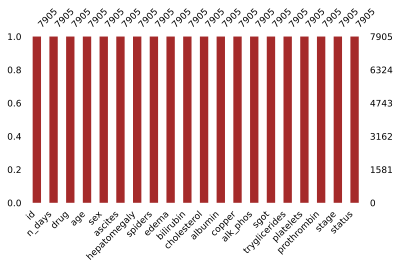

In [13]:
# визуализируем пропуски в датасете train
msno.bar(
    train,
    figsize = (6, 3),
    fontsize = 9,
    labels = True,
    color = 'brown'
)
plt.show()

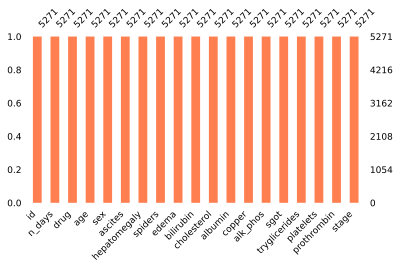

In [14]:
# визуализируем пропуски в датасете test
msno.bar(
    test,
    figsize = (6, 3),
    fontsize = 9,
    labels = True,
    color = 'coral'
)
plt.show()

Визуально пропусков в датасетах нет. Для контроля воспользуемся стандартной командой.

In [15]:
# вычислим по признакам долю строк с пропусками
# от всех строк датасета train
train.isna().sum() / train.shape[0]

id               0.0
n_days           0.0
drug             0.0
age              0.0
sex              0.0
ascites          0.0
hepatomegaly     0.0
spiders          0.0
edema            0.0
bilirubin        0.0
cholesterol      0.0
albumin          0.0
copper           0.0
alk_phos         0.0
sgot             0.0
tryglicerides    0.0
platelets        0.0
prothrombin      0.0
stage            0.0
status           0.0
dtype: float64

In [16]:
# вычислим по признакам долю строк с пропусками
# от всех строк датасета test
test.isna().sum() / test.shape[0]

id               0.0
n_days           0.0
drug             0.0
age              0.0
sex              0.0
ascites          0.0
hepatomegaly     0.0
spiders          0.0
edema            0.0
bilirubin        0.0
cholesterol      0.0
albumin          0.0
copper           0.0
alk_phos         0.0
sgot             0.0
tryglicerides    0.0
platelets        0.0
prothrombin      0.0
stage            0.0
dtype: float64

В датасетах train и test нет пропущенных значений.

Проверим датасеты на наличие дубликатов.

In [17]:
#  проверим наличие дубликатов в датасете train
train.duplicated().sum()

0

In [18]:
#  проверим наличие дубликатов в датасете test
test.duplicated().sum()

0

Явных дубликатов в датасетах train и test нет.

In [19]:
# выведем общую статистику по
# числовым признакам датасета train
train.describe().T

,count,mean,std,min,25%,50%,75%,max
id,7905.0,3952.000000,2282.121272,0.00,1976.00,3952.00,5928.00,7904.00
n_days,7905.0,2030.173308,1094.233744,41.00,1230.00,1831.00,2689.00,4795.00
age,7905.0,18373.146490,3679.958739,9598.00,15574.00,18713.00,20684.00,28650.00
bilirubin,7905.0,2.594485,3.812960,0.30,0.70,1.10,3.00,28.00
cholesterol,7905.0,350.561923,195.379344,120.00,248.00,298.00,390.00,1775.00
albumin,7905.0,3.548323,0.346171,1.96,3.35,3.58,3.77,4.64
copper,7905.0,83.902846,75.899266,4.00,39.00,63.00,102.00,588.00
alk_phos,7905.0,1816.745250,1903.750657,289.00,834.00,1181.00,1857.00,13862.40
sgot,7905.0,114.604602,48.790945,26.35,75.95,108.50,137.95,457.25
tryglicerides,7905.0,115.340164,52.530402,33.00,84.00,104.00,139.00,598.00


In [20]:
# выведем общую статистику по
# числовым признакам датасета test
test.describe().T

,count,mean,std,min,25%,50%,75%,max
id,5271.0,10540.000000,1521.750965,7905.00,9222.50,10540.00,11857.50,13175.00
n_days,5271.0,2038.696642,1086.843490,41.00,1234.00,1882.00,2692.00,4795.00
age,5271.0,18497.756782,3583.898801,9598.00,15730.00,18806.00,20684.00,28650.00
bilirubin,5271.0,2.600389,3.852395,0.30,0.70,1.10,3.00,28.00
cholesterol,5271.0,352.486435,200.438989,120.00,248.00,299.00,390.00,1775.00
albumin,5271.0,3.538071,0.354886,1.96,3.35,3.57,3.77,4.64
copper,5271.0,84.701679,77.542064,4.00,39.00,65.00,102.00,588.00
alk_phos,5271.0,1811.233314,1935.351492,289.00,823.00,1142.00,1838.50,13862.40
sgot,5271.0,113.587526,48.964789,26.35,75.00,106.95,137.95,457.25
tryglicerides,5271.0,115.286094,52.602780,33.00,84.00,104.00,138.00,598.00


Отметим значительный разброс значений некоторых признаков. Значения разных признаков не находятся в одном масштабе. Необходимо провести анализ каждого признака на наличие выбросов.



### <font color='mediumblue'>**Выводы по п. 1.1 Подготовка данных. Первичный анализ данных**</font>

---

**(1)** Датасеты train и test содержат 19 общих признаков, из которых 13 числовых и 6 категориальных. Датасет train также содержит категориальный целевой признак 'status'.

**(2)** Число наблюдений в датасете train: 7905, в датасете test: 5271.

**(3)** В датасетах train и test отсутствуют пропущенные значения и явные дубликаты

**(4)** Общая статистика по числовым признакам датасетов train и test показывает, что значения признаков не нормализованы, стандартное отклонение разных признаков значительно различается. Необходимо провести дополнительную проверку числовых признаков на выбросы.

**(5)** Категориальные признаки необходимо проверить на предмет, являются ли они бинарными, и принять решение об их кодировании.

**(6)** На фоне числовых признаков особо выделяется признак 'age', который, очевидно, дан в закодированном виде, вероятно, в количестве дней человека с момента рождения.


### <font color='green'>**1.2 Предобработка данных**</font>

---

### **1.2.1. Предобработка числовых признаков**

---

Создадим список, включающий название всех числовых признаков датасетов train и test.

In [21]:
# создаем список названий числовых признаков датасета train
numerical_columns_selector = selector(dtype_include = 'number')
num_columns = numerical_columns_selector(train)
num_columns

['id',
 'n_days',
 'age',
 'bilirubin',
 'cholesterol',
 'albumin',
 'copper',
 'alk_phos',
 'sgot',
 'tryglicerides',
 'platelets',
 'prothrombin',
 'stage']

Зададим функцию для визуализации распределений и выбросов числовых признаков.

In [22]:
# создаем функцию для визуализации распределения
# значений числовых признаков
def outliers_and_features_distribution(data, name, description, color):
    """зададим параметры диаграммы 'ящик с усами' """
    plt.figure(figsize = (7.5, 0.5))
    h = sns.boxplot(x = data[name],
            data = data,
            linewidth=2.5,
            width=0.5)
    plt.xlabel(f'{description}', fontsize=12)
    plt.title(f'Выбросы в признаке \'{name}\'', fontsize = 12)
    h.tick_params(axis='x', labelrotation=0, labelsize=12)
    h.set_facecolor(color)
    plt.show()

    """зададим параметры гистограммы """
    plt.figure(figsize = (6.75, 2.5))
    h = data[name].plot(
        kind = 'hist', bins = 50, label = name,
        legend = False, grid = True, color = color,
        edgecolor='darkblue', linewidth=1.2
        )
    plt.title(f'Распределение значений в признаке\n \'{name}\'', fontsize = 12)
    plt.xlabel(f'{description}', fontsize=12)
    plt.ylabel('Частота встречаемости', fontsize=12)
    plt.show()

Распределение признака **'id'** рассматривать не будем - для машинного обучения он использоваться не будет. Признак **'id'** необходим только для формирования submit-файла.

Признак **'n_days'**.

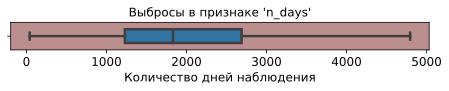

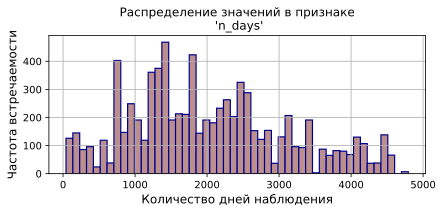

In [23]:
outliers_and_features_distribution(
    train,
    'n_days',
    'Количество дней наблюдения',
    'rosybrown')

Признак **'age'**.

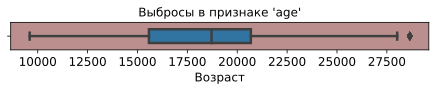

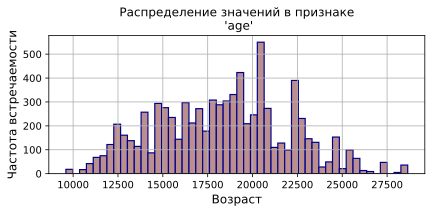

In [24]:
outliers_and_features_distribution(
    train,
    'age',
    'Возраст',
    'rosybrown')

Признак **'bilirubin'**.

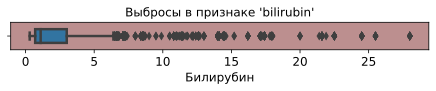

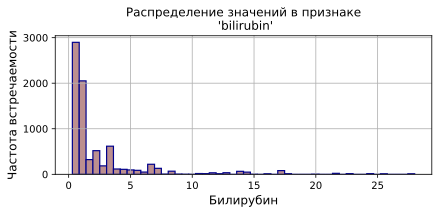

In [25]:
outliers_and_features_distribution(
    train,
    'bilirubin',
    'Билирубин',
    'rosybrown')

Признак **'cholesterol'**.

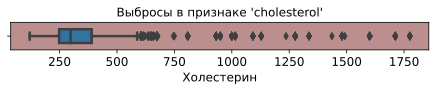

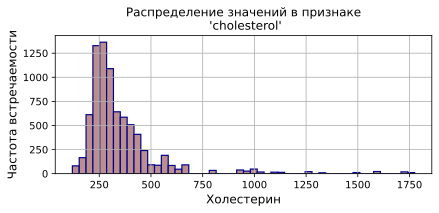

In [26]:
outliers_and_features_distribution(
    train,
    'cholesterol',
    'Холестерин',
    'rosybrown')

Признак **'albumin'**.

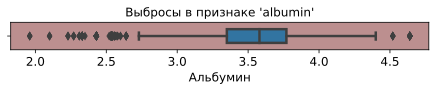

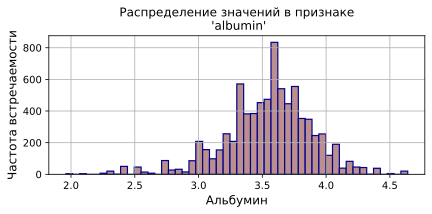

In [27]:
outliers_and_features_distribution(
    train,
    'albumin',
    'Альбумин',
    'rosybrown')

Признак **'copper'**.

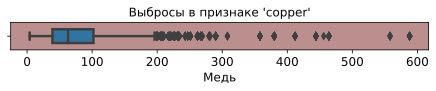

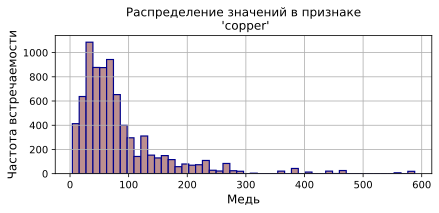

In [28]:
outliers_and_features_distribution(
    train,
    'copper',
    'Медь',
    'rosybrown')

Признак **'alk_phos'**.

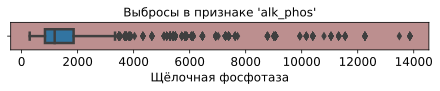

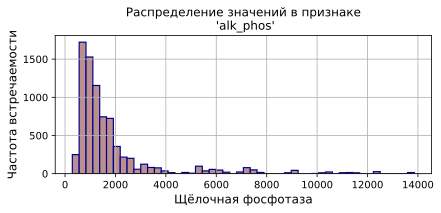

In [29]:
outliers_and_features_distribution(
    train,
    'alk_phos',
    'Щёлочная фосфотаза',
    'rosybrown')

Признак **'sgot'**.

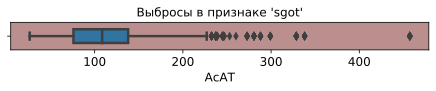

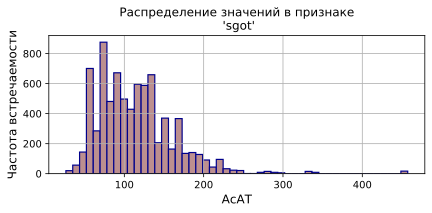

In [30]:
outliers_and_features_distribution(
    train,
    'sgot',
    'АсАТ',
    'rosybrown')

Признак **'tryglicerides'**.

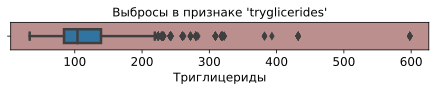

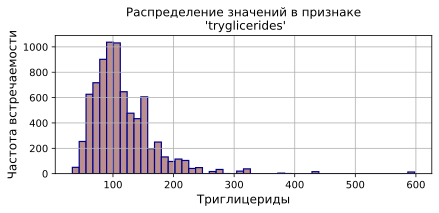

In [31]:
outliers_and_features_distribution(
    train,
    'tryglicerides',
    'Триглицериды',
    'rosybrown')

Признак **'platelets'**.

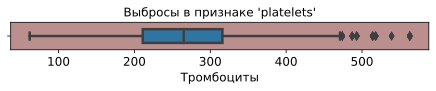

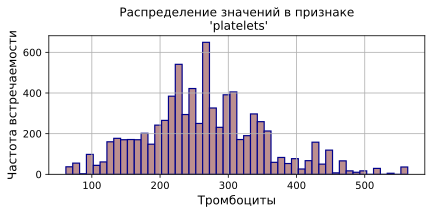

In [32]:
outliers_and_features_distribution(
    train,
    'platelets',
    'Тромбоциты',
    'rosybrown')

Признак **'stage'**.

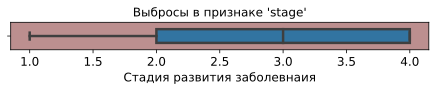

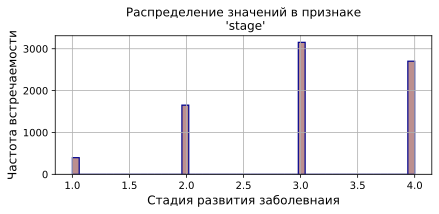

In [33]:
outliers_and_features_distribution(
    train,
    'stage',
    'Стадия развития заболевнаия',
    'rosybrown')

В признаках 'n_days', 'stage' значений, которые могут быть рассмотрены как выбросы, нет.

В признаках 'age', 'cholesterol', 'albumin', 'copper', 'albumin', 'sgot', 'tryglicerides', 'platelets' отмечается незначительное/небольшое число значений, которые могут быть рассмотрены, как выбросы.

В признаках 'bilirubin', 'alk_phos' отмечается значительно число означений, которые могут быть рассмотрены как выбросы.

Для достижения цели проекта будет использована модель, основанная на решающих деревьях, – CatBoost. Для такого типа моделей наличие выбросов не является негативным фактором.

Однако дополнительно будет реализовано сжатие данных для машинного обучения с помощью **PCA** и **LDA** и последующая передача их в модель CatBoost. Для методов PCA и LDA наличие выбросов может исказить картину, поэтому в пайплайне будет предусмотрено удаление выбросов.


Проверим, насколько велико число значений, определяемых как выбросы, в признаках **'bilirubin'**, **'alk_phos'**, 'лидирующих' по количеству значений, вышедших за 1.5-й межквартильный интервал.

In [34]:
# вычислим долю значений, определяемых как выбросы
# в признаке 'bilirubin'
train.query('bilirubin > 6').shape[0] / train.shape[0]

0.11208096141682479

In [35]:
# вычислим долю значений, определяемых как выбросы
# в признаке 'alk_phos'
train.query('alk_phos > 3200').shape[0] / train.shape[0]

0.10664136622390892

Пока мы не знаем в точности, пересекаются ли выбросы признаков 'bilirubin' и 'alk_phos', поэтому речь идет о возможной потере от 10.6% до 21.8% наблюдений. А если учесть потенциально определяемые как выбросы значения в других признаках, то количество удаленных наблюдений может оказаться еще выше. Вероятно, целесообразно провести обучение модели на сжатых данных с двумя параметрами: с сохранением 90% и 95% исходных данных, и сравнить полученный результат.

Дополнительно вычислим долю потенциальных выбросов в признаках, в которых их число визуально определяется как небольшое.


In [36]:
# вычисляем долю выбросов в признаке
a = (
    round(train.query('albumin < 2.7').shape[0] / train.shape[0], 3) +
    round(train.query('albumin > 4.5').shape[0] / train.shape[0], 3)
)
print(f'Доля выбросов в признаке \'albumin\' {a}')

b = round(train.query('cholesterol > 600').shape[0] / train.shape[0], 3)
print(f'Доля выбросов в признаке \'cholesterol\' {b}')

c = round(train.query('copper > 200').shape[0] / train.shape[0], 3)
print(f'Доля выбросов в признаке \'copper\' {c}')

Доля выбросов в признаке 'albumin' 0.022
Доля выбросов в признаке 'cholesterol' 0.064
Доля выбросов в признаке 'copper' 0.075


Мы видим, что в признаках с меньшим числом потенциальных выбросов число наблюдений, которое может быть удалено, тоже значительно. Можно сделать предположение, что в целом выбросы по отдельным наблюдениям в основном совпдаают. Проводить точную проверку этого предположения не требуется, т.к. запланировано обучение модели CatBoost на всех исходных данных и отдельно на данных сжатых с помощью PCA и LDA.

### **1.2.2. Предобработка категориальных признаков**

---

In [37]:
# создаем список названий категориальных признаков датасета train
categorical_columns_selector = selector(dtype_include = 'object')
cat_columns = categorical_columns_selector(train)
cat_columns

['drug', 'sex', 'ascites', 'hepatomegaly', 'spiders', 'edema', 'status']

Рассмотрим каждый признак в отдельности для принятия решения о кодировании значений признака.

In [38]:
# создадим функцию для вывода серии рисунков
# с количеством категорий в каждом признаке
def visualization_categorical_columns(data, list_names):
    for i in list_names:
        plt.figure(figsize = (5, 3))
        data[i].value_counts(normalize = True).plot(
        kind = 'bar',
        grid = True,
        color = 'lightgreen',
        linewidth = 3,
        edgecolor = 'teal')
        plt.title(f'Распределение значений в признаке\n \'{i}\'')
        plt.xticks(rotation = 0)
        plt.show()

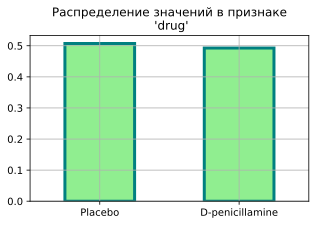

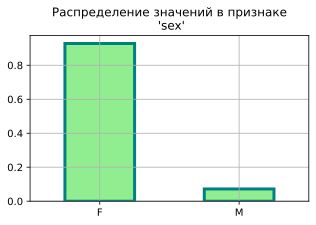

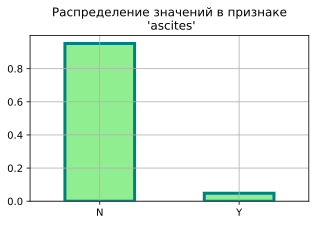

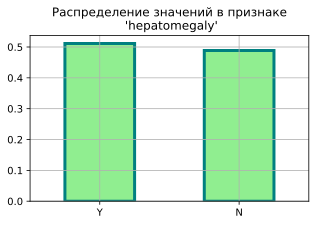

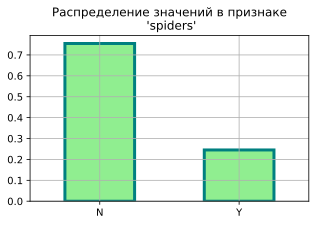

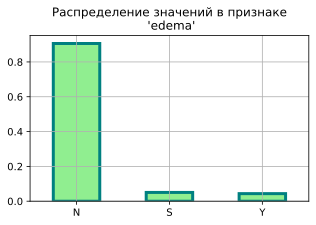

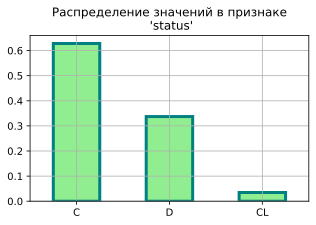

In [39]:
# визуализируем распределение значений
# в категориальных признаках
visualization_categorical_columns(
    train,
    cat_columns)

Количество категорий в каждом из признаков – от двух до трех. Для модели CatBoost предусмотрим в Pipeline применение TargetEncoder из библиотеки category_encoders. Для сжатия данных с помощью PCA и LDA применим OneHotEncoder с удалением.

Целевой признак 'status' не сбалансирован. В целом для современных моделей машинного обучения дисбаланс целевого признака не является серьезной проблемой, однако применим один из алгоритмов upsampling'a из библиотеки imblearn.

### **1.2.3. Проверка признаков на мультиколинеарность**

---

Для модели, основанной на решающих деревьях, мультиколинеарность не является препятствием. Но так как в дополнение к обучению модели CatBoost на исходных признаках запланировано обучение на признаках, сжатых с помощью линейных алгоритмов, проверим данные на мультиколинеарность. Для этого используем инструментарий из библиотеки phik, позволяющий рассчитать корреляцию не только между числовыми признаками, но и между категориальными и числовыми.

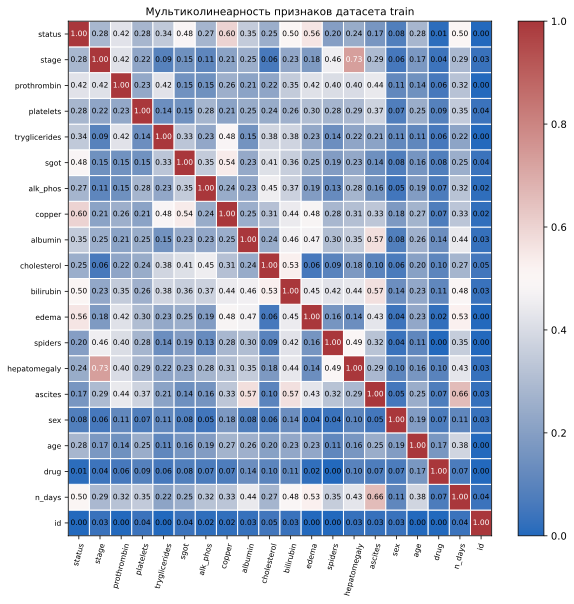

In [40]:
# рассчитаем мультиколинеарность признаков и выведем результат
# в виде матрицы корреляции
interval_cols = train.select_dtypes('number').columns.tolist()
phik_overview = train.phik_matrix(interval_cols=interval_cols)

plot_correlation_matrix(phik_overview.values,
    x_labels=phik_overview.columns,
    y_labels=phik_overview.index,
    vmin=0, vmax=1, color_map='vlag',
    title=r'Мультиколинеарность признаков датасета train',
    fontsize_factor=0.75,
    figsize=(8.5, 8.5))
plt.xticks(rotation = 75)
plt.tight_layout()

Максимально наблюдаемый уровень корреляции составляет 0.73, что согласно Шкале корреляции Чедока не является очень высоким уровнем корреляции.

### **1.2.4. Формирование обучающего комплекта данных**

---

Из датасета train выделим обучающие признаки и целевой признак 'status'. Из числа обучающих признаков будет удален признак 'id', не имеющий прямого отношения к получению предсказаний.

В датасете test отсутствует целевой признак. Признак 'id' из датасета test будет удален, выделен в отдельную переменную и объединен с предсказанными моделью вероятностями типов статусов.

In [41]:
# выведем размер датасета train
# до формирования обучающего комплекта
train.shape

(7905, 20)

In [42]:
# формируем обучающий комплект
target = train['status']
train_features = train.drop(columns = ['id', 'status'])

# выведем размеры датасетов train_features и target
train_features.shape, target.shape

((7905, 18), (7905,))

In [43]:
# выведем размер датасета test до преобразования
test.shape

(5271, 19)

In [44]:
# сформируем переменную с id пациентов
# из датасета test
test_id = test['id']
test_id.head()

0    7905
1    7906
2    7907
3    7908
4    7909
Name: id, dtype: int64

In [45]:
# удалим признак 'id' из датасета test
test = test.drop(columns = ['id'])
test.shape

(5271, 18)

Для запланированных к применению во время машинного обучения функций необходима целевая переменная target в числовом закодированном виде.

In [46]:
# сделаем копию целевого признака target
target_numeric = target.copy()

# выведем информацию о распределении значений целевого признака
# до преобразования
target_numeric.value_counts(normalize = True).sort_index()

C     0.628083
CL    0.034788
D     0.337128
Name: status, dtype: float64

In [47]:
# кодируем значения переменной target_xgboost
target_numeric.replace('C', 0, inplace = True)
target_numeric.replace('CL', 1, inplace = True)
target_numeric.replace('D', 2, inplace = True)

# выведем информацию о распределении значений целевого признака
# после преобразования
target_numeric.value_counts(normalize = True).sort_index()

0    0.628083
1    0.034788
2    0.337128
Name: status, dtype: float64

### **1.2.5. Подготовка данных датасета train_features для сжатия с помощью PCA, LDA, t-SNE**

---

In [48]:
# создадим копию датасета train_features
train_copy = train_features.copy()

Для применения PCA и LDA числовые признаки должны быть очищены от выбросов и нормализованы, иначе PCA и LDA, в основе которых лежат линейные алгоритмы, выдадут неверную оценку. Категориальные данные необходимо закодировать и преобразовать в числовые.

Поэтому реализуем следующий подход. Для каждого признака будет рассчитан межквартильный интервал, левая и правая границы выбросов. Все выбросы выше правой границы будут заменены на значение этой правой границы. Все выбросы менее левой границы, будут заменены на значение левой границы. Этот подход позволит сохранить много ценной информации, содержащейся по другим признакам соответствующего наблюдения.

Ранее были созданы списки названий числовых и категориальных признаков.

Так как датасеты были обработаны для передачи моделям машинного обучения, актуализируем списки с названиями числовых и категориальных признаков.

In [49]:
# названия числовых признаков
# создаем список названий числовых признаков датасета train_features
numerical_columns_selector = selector(dtype_include = 'number')
num_columns = numerical_columns_selector(train_features)
num_columns

['n_days',
 'age',
 'bilirubin',
 'cholesterol',
 'albumin',
 'copper',
 'alk_phos',
 'sgot',
 'tryglicerides',
 'platelets',
 'prothrombin',
 'stage']

In [50]:
# названия категориальных признаков
# создаем список названий категориальных признаков датасета train_features
categorical_columns_selector = selector(dtype_include = 'object')
cat_columns = categorical_columns_selector(train_features)
cat_columns

['drug', 'sex', 'ascites', 'hepatomegaly', 'spiders', 'edema']

In [51]:
# проверим, что заголовки признаков датасетов train_features
# и test совпадают
sum(train_features.columns == test.columns) / train_features.shape[1]

1.0

Создадим функцию, которая позволит для каждого числового признака:

 * рассчитать межквартильный интервал;

 * рассчитать левую и правую границы выбросов;

 * заменить значения, выходящие за правую границу, на значение правой границы;

 * заменить значения, выходящие за левую границу, на значение левой границы.


In [52]:
# функция для обработки выбросов
def treating_outliers(data, columns_names):
    for column in columns_names:
        # вычисляем 1-й и 3-й квартиль
        q1 = np.percentile(np.array(data[column]), 25)
        q3 = np.percentile(np.array(data[column]), 75)
        # вычисляем межквартильный интервал
        iqr = q3 - q1
        # вычисляем левую и правую границы выбросов
        left_bound = q1 - 1.5 * iqr
        right_bound = q3 + 1.5 * iqr
        # заменяем выбросы на соответствующее значение
        # левой или правой границы
        data.loc[data[column] <= left_bound, column] = left_bound
        data.loc[data[column] >= right_bound, column] = right_bound
    return data

In [53]:
# выведем размеры датасета train_copy
# до обработки выбросов
train_copy.shape

(7905, 18)

In [54]:
# обработаем выбросы
train_copy = treating_outliers(train_copy, num_columns)

In [55]:
# выведем размеры датасета train_copy
# после обработки выбросов
train_copy.shape

(7905, 18)

Наглядно убедимся, что выбросы удалены - выведем рисунки с распределениями значений числовых признаков.

In [56]:
# создадим функцию для вывода серии рисунков, отражающих
# распределение значений признаков
def feature_distribution(data, columns_names, color):
    for column in columns_names:
        plt.figure(figsize = (7, 0.5))
        h = sns.boxplot(x = data[column],
            data = data,
            linewidth=2.5,
            width=0.5)
        plt.xlabel(None)
        plt.title(f'Распределение значений признака\n {column}', fontsize = 12)
        h.tick_params(axis='x', labelrotation=0, labelsize=12)
        h.set_facecolor(color)
    plt.show()

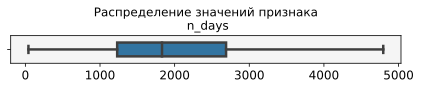

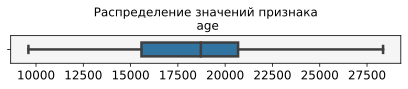

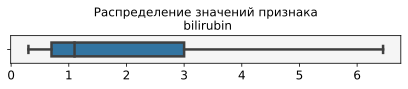

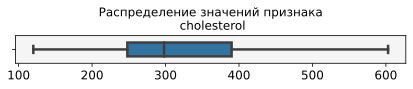

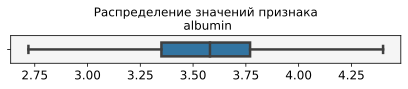

...

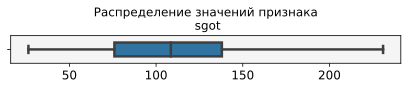

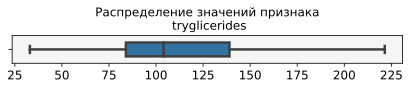

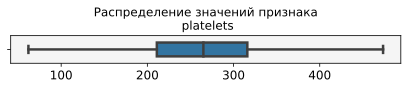

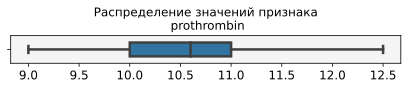

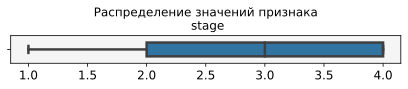

In [57]:
# визуализируем распределение значений числовых признаков
# после обработки выбросов
feature_distribution(
    train_copy,
    num_columns,
    'whitesmoke')

Распределение значений признаков, безусловно, изменилось, прежде всего в тех признаках, в которых было выявлено много выбросов: в них увеличилась концентрация на левой и/или правой границе выбросов. Однако значительная часть информации сохранена для машинного обучения.

In [58]:
# закодируем категориальные признаки в числовые
ohe_encoder = OneHotEncoder(
    sparse = False,
    drop = 'first')

Напомним, что перечень категориальных признаков сохранен в переменную **'cat_columns'**.

In [59]:
# кодируем категориальные переменные
train_copy_ohe = ohe_encoder.fit_transform(
    train_copy[cat_columns]
)

In [60]:
# выведем список названий закодированных переменных
ohe_encoder.get_feature_names_out()

array(['drug_Placebo', 'sex_M', 'ascites_Y', 'hepatomegaly_Y',
       'spiders_Y', 'edema_S', 'edema_Y'], dtype=object)

In [61]:
# преобразуем закодированные переменные в DataFrame
train_copy_ohe = pd.DataFrame(
    train_copy_ohe,
    columns = ohe_encoder.get_feature_names_out()
)
train_copy_ohe.head(3)

,drug_Placebo,sex_M,ascites_Y,hepatomegaly_Y,spiders_Y,edema_S,edema_Y
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,1.0,1.0,0.0,1.0


In [62]:
# для контроля выведем размеры датасетов
train_features[num_columns].shape, train_copy_ohe.shape

((7905, 12), (7905, 7))

In [63]:
# объединим закодированные категориальные признаки
# с исходными числовыми признаками
train_for_compress = pd.concat(
    [train_features[num_columns],
     train_copy_ohe], axis = 1
)
train_for_compress.shape

(7905, 19)

In [64]:
# выведем первые пять строк закодированного датасета
train_for_compress.head()

,n_days,age,bilirubin,cholesterol,albumin,copper,alk_phos,sgot,tryglicerides,platelets,prothrombin,stage,drug_Placebo,sex_M,ascites_Y,hepatomegaly_Y,spiders_Y,edema_S,edema_Y
0,999,21532,2.3,316.0,3.35,172.0,1601.0,179.80,63.0,394.0,9.7,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,2574,19237,0.9,364.0,3.54,63.0,1440.0,134.85,88.0,361.0,11.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3428,13727,3.3,299.0,3.55,131.0,1029.0,119.35,50.0,199.0,11.7,4.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0
3,2576,18460,0.6,256.0,3.50,58.0,1653.0,71.30,96.0,269.0,10.7,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,788,16658,1.1,346.0,3.65,63.0,1181.0,125.55,96.0,298.0,10.6,4.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


Следующий шаг - нормализация (центрирование) данных.

In [65]:
# объявляем объект StandardScaler
scaler = StandardScaler()

In [66]:
# нормализуем (центрируем) даныне для PCA
train_for_compress = scaler.fit_transform(train_for_compress)

In [67]:
# выведем размер подготовленной матрицы
train_for_compress.shape

(7905, 19)

Небольшое количество признаков, возможно, не позволит извлечь максимальную пользу от применения методов сжатия данных PCA и LDA. Поэтому с помощью **PolynomialFeatures** создадим второй вариант датасета для сжатия.

In [68]:
# объявляем объект PolynomialFeatures
degree = 2
polynom = PolynomialFeatures(degree = degree)

In [69]:
# создаем полиномиальные признаки из признаков
# датасета train_for_compress
train_for_compress_polynom = polynom.fit_transform(
    train_for_compress
)

In [70]:
# выведем названия полученных полиномиальных признаков
polynom.get_feature_names_out()

array(['1', 'x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9',
       'x10', 'x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18',
       'x0^2', 'x0 x1', 'x0 x2', 'x0 x3', 'x0 x4', 'x0 x5', 'x0 x6',
       'x0 x7', 'x0 x8', 'x0 x9', 'x0 x10', 'x0 x11', 'x0 x12', 'x0 x13',
       'x0 x14', 'x0 x15', 'x0 x16', 'x0 x17', 'x0 x18', 'x1^2', 'x1 x2',
       'x1 x3', 'x1 x4', 'x1 x5', 'x1 x6', 'x1 x7', 'x1 x8', 'x1 x9',
       'x1 x10', 'x1 x11', 'x1 x12', 'x1 x13', 'x1 x14', 'x1 x15',
       'x1 x16', 'x1 x17', 'x1 x18', 'x2^2', 'x2 x3', 'x2 x4', 'x2 x5',
       'x2 x6', 'x2 x7', 'x2 x8', 'x2 x9', 'x2 x10', 'x2 x11', 'x2 x12',
       'x2 x13', 'x2 x14', 'x2 x15', 'x2 x16', 'x2 x17', 'x2 x18', 'x3^2',
       'x3 x4', 'x3 x5', 'x3 x6', 'x3 x7', 'x3 x8', 'x3 x9', 'x3 x10',
       'x3 x11', 'x3 x12', 'x3 x13', 'x3 x14', 'x3 x15', 'x3 x16',
       'x3 x17', 'x3 x18', 'x4^2', 'x4 x5', 'x4 x6', 'x4 x7', 'x4 x8',
       'x4 x9', 'x4 x10', 'x4 x11', 'x4 x12', 'x4 x13', 'x4 x14',
       'x

In [71]:
# выведем размер датасета
# с полиномиальными признаками
train_for_compress_polynom.shape

(7905, 210)

### **1.2.6. Подготовка данных датасета test для сжатия с помощью PCA, LDA, t-SNE**

---

 Для обработки датасета test воспользуемся функциями, созданными в предыдущем пункте при обработке датасета train_features. Последовательность действий будет аналогичной, за исключеинем того, что для созданных объектов для датасета test будет применена комнада .trasform().

In [72]:
# создадим копию датасета test
test_copy = test.copy()

Ранее были созданы списки названий числовых и категориальных признаков.

Так как датасеты были обработаны для передачи моделям машинного обучения, актуализируем списки с названиями числовых и категориальных признаков.

In [73]:
# выведем размеры датасета test_copy
# до обработки выбросов
test_copy.shape

(5271, 18)

In [74]:
# обработаем выбросы
test_copy = treating_outliers(test_copy, num_columns)

In [75]:
# выведем размеры датасета train_copy
# после обработки выбросов
test_copy.shape

(5271, 18)

Наглядно убедимся, что выбросы удалены - выведем рисунки с распределениями значений числовых признаков.

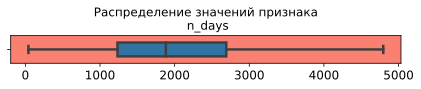

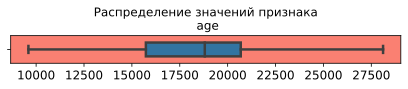

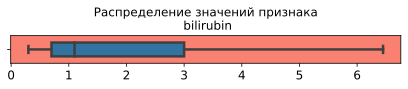

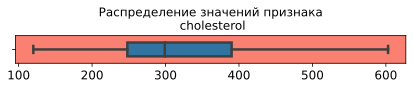

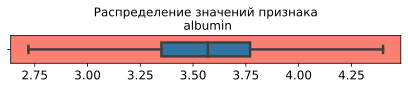

...

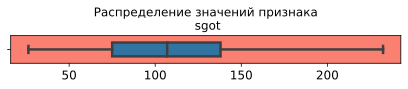

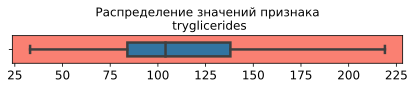

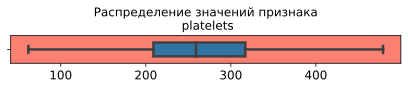

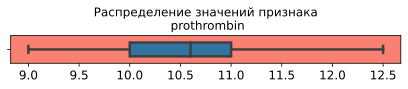

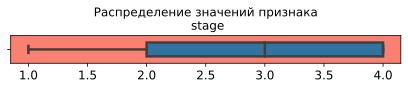

In [76]:
# визуализируем распределение значений числовых признаков
# после обработки выбросов
feature_distribution(
    test_copy,
    num_columns,
    'salmon')

Мы убедились, что выбросы обработаны.

На следующем шаге закодируем категориальыне переменные.

In [77]:
# кодируем категориальные переменные
test_copy_ohe = ohe_encoder.transform(
    test_copy[cat_columns]
)

In [78]:
# выведем список названий закодированных переменных
ohe_encoder.get_feature_names_out()

array(['drug_Placebo', 'sex_M', 'ascites_Y', 'hepatomegaly_Y',
       'spiders_Y', 'edema_S', 'edema_Y'], dtype=object)

In [79]:
# преобразуем закодированные переменные в DataFrame
test_copy_ohe = pd.DataFrame(
    test_copy_ohe,
    columns = ohe_encoder.get_feature_names_out()
)
test_copy_ohe.head(3)

,drug_Placebo,sex_M,ascites_Y,hepatomegaly_Y,spiders_Y,edema_S,edema_Y
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,1.0,0.0,0.0,1.0


In [80]:
# для контроля выведем размеры датасетов
test[num_columns].shape, test_copy_ohe.shape

((5271, 12), (5271, 7))

In [81]:
# объединим закодированные категориальные признаки
# с исходными числовыми признаками
test_for_compress = pd.concat(
    [test[num_columns],
     test_copy_ohe], axis = 1
)
test_for_compress.shape

(5271, 19)

In [82]:
# выведем первые пять строк закодированного датасета
test_for_compress.head()

,n_days,age,bilirubin,cholesterol,albumin,copper,alk_phos,sgot,tryglicerides,platelets,prothrombin,stage,drug_Placebo,sex_M,ascites_Y,hepatomegaly_Y,spiders_Y,edema_S,edema_Y
0,3839,19724,1.2,546.0,3.37,65.0,1636.0,151.90,90.0,430.0,10.6,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,2468,14975,1.1,660.0,4.22,94.0,1257.0,151.90,155.0,227.0,10.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,51,13149,2.0,151.0,2.96,46.0,961.0,69.75,101.0,213.0,13.0,4.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
3,2330,20510,0.6,293.0,3.85,40.0,554.0,125.55,56.0,270.0,10.6,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1615,21904,1.4,277.0,2.97,121.0,1110.0,125.00,126.0,221.0,9.8,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


Следующий шаг - нормализация (центрирование) данных.

In [83]:
# нормализуем (центрируем) даныне для PCA
test_for_compress = scaler.transform(test_for_compress)

In [84]:
# выведем размер подготовленной матрицы
test_for_compress.shape

(5271, 19)

С помощью **PolynomialFeatures** создадим второй вариант датасета для сжатия.

In [85]:
# создаем полиномиальные признаки из признаков
# датасета test_for_compress
test_for_compress_polynom = polynom.transform(
    test_for_compress
)

In [86]:
# выведем размер датасета
# с полиномиальными признаками
test_for_compress_polynom.shape

(5271, 210)

### **1.2.7. Подбор количества главных компонент (PCA) для датасетов train_for_compress и train_for_compress_polynom**

---

Подбор количества главных компонент (РСА) проведем для датасетов **train_for_compress** и **train_for_compress_polynom**. Для датасетов **test_for_compress** и **test_for_compress_polynom** будет взято количество главных компонент, подобранное для соответствующих первых двух датасетов.

Подбор количества главных компонент (РСА) начнем с датасета **train_for_compress**.

In [87]:
# объявляем объект PCA
pca = PCA(random_state = RANDOM_STATE)

In [88]:
# сжимаем данные
train_compressed = pca.fit(train_for_compress)

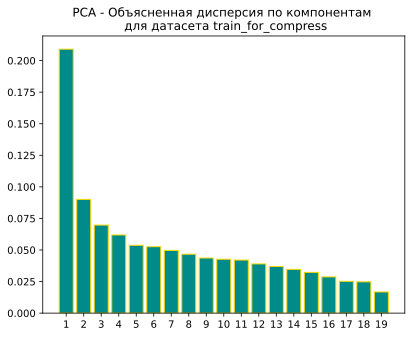

In [89]:
# визуализируем, какую часть дисперсии
# объясняем каждая из компонент
plt.bar(
    range(1, train_for_compress.shape[1] + 1),
    pca.explained_variance_ratio_,
    color = 'darkcyan',
    linewidth = 1,
    edgecolor = 'gold')
plt.xticks(range(1, train_for_compress.shape[1] + 1))
plt.title('PCA - Объясненная дисперсия по компонентам \n для датасета train_for_compress')
plt.show()

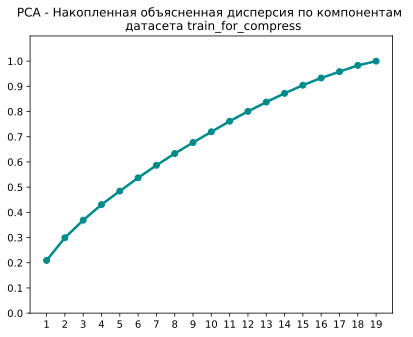

In [90]:
# визуализируем накопительную объясненную дисперсию
plt.plot(
    range(1, train_for_compress.shape[1] + 1),
    np.cumsum(pca.explained_variance_ratio_),
    'o-',
    color = 'darkcyan',
    linewidth = 2.5
)
plt.xticks(range(1, train_for_compress.shape[1] + 1))
plt.yticks(np.arange(0, 1.1, 0.1))
plt.title('PCA - Накопленная объясненная дисперсия по компонентам \n датасета train_for_compress')
plt.ylim(0, 1.1)
plt.show()

90% дисперсии объясняют первые 15 компонент из 19. 95% дисперсии объясняют первые 17 компонент из 19. Явно выраженного лидера (лидеров) среди компонент нет. Поэтому целесообразно в пайплайне для машинного обучения предусмотреть разное количество главных компонент.

Аналогичным образом подберем число главных компонент для датасета **train_for_compress_polynom**.

In [91]:
# объявляем объект PCA
pca = PCA(random_state = RANDOM_STATE)

In [92]:
# сжимаем данные
train_compressed_polynom = pca.fit(train_for_compress_polynom)

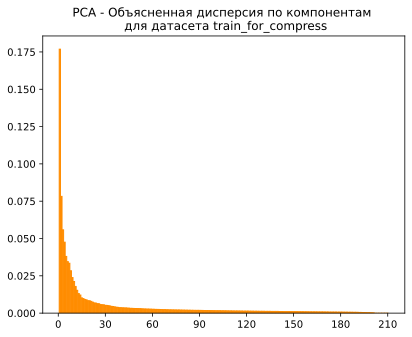

In [93]:
# визуализируем, какую часть дисперсии
# объясняем каждая из компонент
plt.bar(
    range(1, train_for_compress_polynom.shape[1] + 1),
    pca.explained_variance_ratio_,
    color = 'darkorange',
    linewidth = 1,
    edgecolor = 'darkorange')
plt.xticks(range(0, 211, 30))
plt.title('PCA - Объясненная дисперсия по компонентам \n для датасета train_for_compress')
plt.show()

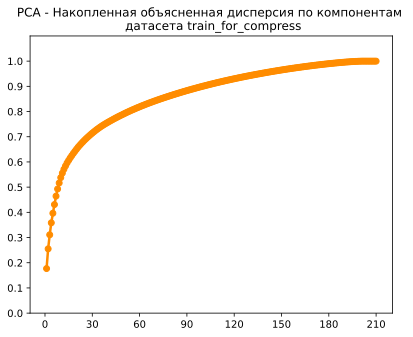

In [94]:
# визуализируем накопительную объясненную дисперсию
plt.plot(
    range(1, train_for_compress_polynom.shape[1] + 1),
    np.cumsum(pca.explained_variance_ratio_),
    'o-',
    color = 'darkorange',
    linewidth = 2.5
)
plt.xticks(range(0, 211, 30))
plt.yticks(np.arange(0, 1.1, 0.1))
plt.title('PCA - Накопленная объясненная дисперсия по компонентам \n датасета train_for_compress')
plt.ylim(0, 1.1)
plt.show()

Для полиномиальных признаков также нельзя выделить ограниченную группу, которая описывала бы 90-95% дисперсии. 90% дисперсии объясняют примерно 110 признаков из 210. 95% дисперсии объясняют примерно 145 признаков из 210.

Для датасета **test_for_compress_polynom** аналогично целесообразно предусмотреть в пайплайне разное количество главных компонент.

### <font color='mediumblue'>**Выводы по п. 1.2 Предобработка данных**</font>

---

**(1)** Среди числовых признаков в двух признаках 'bilirubin', 'alk_phos' присутствует значительное число значений, которые могут быть определены, как выбросы (11.2% и 10.6% соответственно). В двух признаках выбросов нет вообще, в остальных их количество небольшое или незначительное.


**(2)** Алгоритмы моделей, основанных на решающих деревьях, устойчивы к выбросам. Поэтому для обучения модели CatBoost удалять выбросы не требуется. Помимо обучения модели CatBoost на исходных данных планируется сжать данные с помощью PCA и LDA и обучить CatBoost на сжатых данных. Алгоритмы PCA и LDA чувствительны к выбросам, поэтому при их применении в пайплайнах предусмотрим удаление выбросов.

**(3)** Каждый из категориальных признаков содержит от двух до трех категорий. Для модели CatBoost категориальные признаки будут закодированы с помощью OrdinalEncoder. Для сжатия данных с помощью PCA и LDA применим OneHotEncoder с параметром drop_first = True.

**(4)** Проверка числовых и категориальных признаков датасета train на мультиколлинеарность не выявила признаков с очень высоким уровнем линейной корреляции.

**(5)** Из датасета train сформирован обучающий комплект данных, включающий датасеты train_features и target. Из датасета test id пациентов выделены в отдельную переменную ‘test_id’, которая будет объединена с предсказанными вероятностями статусов пациентов в submit-файле. Для получения предсказанных вероятностей статусов признак ‘id’удален из датасета test.

**(6)** Данные датасетов **train_features** и **test** подготовлены для сжатия с помощью PCA и LDA. С помощью специально подготовленной функции обработаны выбросы. Выбран подход, в соответствии с которым выбросы не удалялись. На основе расчета межквартильного интервала определены левая и правая границы значений, левее и правее которой значения считается выбросом. Все значения меньше значения левой границы заменены на значение левой границы. Все значения, превышающие значение правой границы, заменены на значение правой границы.

Категориальные признаки датасетов закодированы с помощью OneHotEncoder(). Признаки датасетов нормализованы (центрированы) с помощью StandardScaler().

Дополнительно к сформированным таким образом датасетам **train_for_compress** и **test_for_compress** на основе каждого из указанных датасетов подготовлены датасеты с полиномиальными признаками (degree = 2):

 * **train_for_compress_polynom**

* **test_for_compress_polynom**

Каждый из датасетов с полиномиальными признаками включает по 210 признаков.


**(7)** Для датасетов **train_for_compress** и **train_for_compress_polynom** проведен подбор количества главных компонент. В обоих случаях не удалось выявить небольшую группу компонент, которая объясняла бы 90-95% дисперсии. Сделан вывод о том, что целесообразно в пайплайне машинного обучения предусмотреть различное количество главных компонент. Аналогичные выводы распространяются на датасеты **test_for_compress** и **test_for_compress_polynom**.

### <font color='green'>**1.3 Визуальное представление данных высокой размерности**</font>

---

### **1.3.2. Визуальное представление данных высокой размерности с помощью PCA**

---

С помощью PCA построим визуальное представление данных высокой размерности датасетов:

 * **train_for_compress**

 * **train_for_compress_polynom**

На соответствующих рисунках с помощью цвета каждая точка будет соотнесена с одним из трех классов переменной **target**.


Визуализируем распределение классов датасета **train_for_compress**.

In [95]:
# объявляем объект PCA
pca = PCA(n_components = 2)

In [96]:
# получаем матрицу со сжатыми данными
# с двумя главными компонентами
points = pca.fit_transform(train_for_compress)

Для раскраски каждого класса целевого признака, представленных на диаграмме plt.scatter, необходима переменная target, закодированная числовыми значениями. Закодируем ее с помощью OrdinalEncoder.

In [97]:
# объявляем объект OrdinalEncoder
ordinal_encoder = OrdinalEncoder(
    handle_unknown = 'use_encoded_value',
    unknown_value = -1
)

In [98]:
# выведем сведения о количестве значений каждого класса
# целевого признака target
target.value_counts().sort_index()

C     4965
CL     275
D     2665
Name: status, dtype: int64

In [99]:
# кодируем целевой признак
target_pca = ordinal_encoder.fit_transform(pd.DataFrame(target))

In [100]:
# выведем сведения о количестве значений каждого класса
# закодированного целевого признака target_pca
pd.DataFrame(target_pca).value_counts().sort_index()

0.0    4965
1.0     275
2.0    2665
dtype: int64

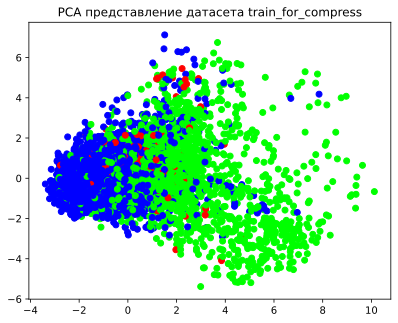

In [101]:
# визуализируем распределение классов датасета  train_for_compress
plt.scatter(
    x = points[:, 0],
    y = points[:, 1],
    cmap = 'brg',
    c = target_pca
)
plt.title('PCA представление датасета train_for_compress')
plt.show()

Визуализируем распределение классов датасета **train_for_compress_polynom**.

In [102]:
# объявляем объект PCA
pca = PCA(n_components = 2)

In [103]:
# получаем матрицу со сжатыми данными
# с двумя главными компонентами
points_polynom = pca.fit_transform(train_for_compress_polynom)

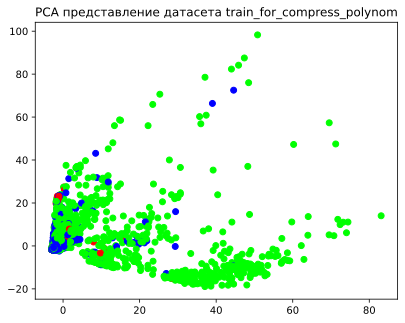

In [104]:
# визуализируем распределение классов датасета  train_for_compress
plt.scatter(
    x = points_polynom[:, 0],
    y = points_polynom[:, 1],
    cmap = 'brg',
    c = target_pca
)
plt.title('PCA представление датасета train_for_compress_polynom')
plt.show()

Визуализация распределения классов с помощью метода PCA по первым двум главным компонентам показывает, что классы плохо разделимы, сильно перемешаны, особенно для датасета с полиномиальными признаками.

### **1.3.2. Визуальное представление данных высокой размерности с помощью LDA**

---

С помощью LDA сжимаем данные датасета **train_for_compress**.

In [105]:
# объявляем объект LDA
lda = LinearDiscriminantAnalysis(
    n_components = 2)

Для передачи в объект LinearDiscriminantAnalysis необходим закодированный target. Закодируем его.

In [106]:
# объявляем переменную с кодировщиком
label_encoder = LabelEncoder()

In [107]:
# выведем структуру классов до кодирования
target.value_counts().sort_index()

C     4965
CL     275
D     2665
Name: status, dtype: int64

In [108]:
# кодируем целевую переменную для LDA
target_lda = label_encoder.fit_transform(target)

In [109]:
# выведем структуру классов закодированного target_lda
pd.Series(target_lda).value_counts().sort_index()

0    4965
1     275
2    2665
dtype: int64

In [110]:
# создаем копии датасетов с обучающими признаками
train_19_features = train_for_compress.copy()
train_210_features = train_for_compress_polynom.copy()
train_19_features.shape, train_210_features.shape

((7905, 19), (7905, 210))

In [111]:
# сжимаем данные
train_lda_19_features = lda.fit_transform(
    train_19_features,
    target_lda)

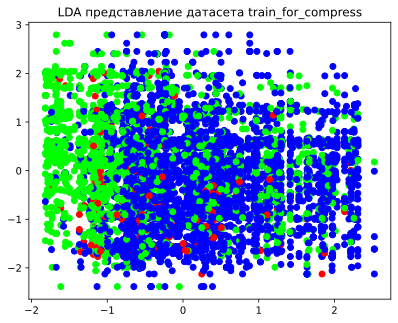

In [112]:
# визуализируем распределение классов датасета train_for_compress
plt.scatter(
    x = train_19_features[:, 0],
    y = train_19_features[:, 1],
    cmap = 'brg',
    c = target_lda
)
plt.title('LDA представление датасета train_for_compress')
plt.show()

Сжимаем и визуализируем данные датасета **train_for_compress_polynom**, сохраненного в датасет **train_210_features**.

In [113]:
# сжимаем данные
train_lda_210_features = lda.fit_transform(
    train_210_features,
    target_lda)

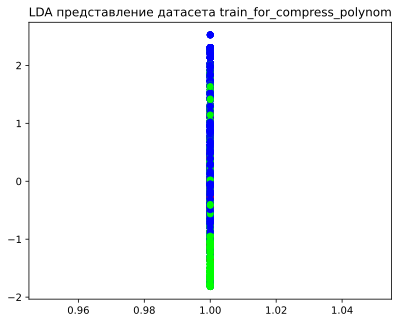

In [114]:
# визуализируем распределение классов датасета train_for_compress
plt.scatter(
    x = train_210_features[:, 0],
    y = train_210_features[:, 1],
    cmap = 'brg',
    c = target_lda
)
plt.title('LDA представление датасета train_for_compress_polynom')
plt.show()

Визуализация с помощью LDA распределения классов датасета, включающего 210 признаков, малоинформативна. В рисунке для 19 признаков (датасет **train_for_compress**) классы более различимы. Однако обращает на себя внимнаие рассредоточение самого малочисленного класса **'CL'**, который перемешан среди многочисленных классов **'C'** и **'D'**.

Очевидно, для моделей машинного обучения будет проблематично правильно выделить класс **'CL'**.

### **1.3.3. Визуальное представление данных высокой размерности с помощью t-SNE**

---

t-SNE относится к непараметрической группе методов. Следовательно, в основном он используется в целях визуализации.

t-SNE является методом, который использует поэтапный итерационный подход для низкоразмерного представления исходных данных с сохранением информации об их локальном соседстве.

С помощью t-SNE можно проиллюстрировать, как данные разделяются на группы. Проверим, как выглядит распределение на классы для трех подготовленных для машинного обучения датасетов:

 * **train_for_compress**

 * **train_for_compress_polynom**

Оба датасета подготовлены для машинного обучения, включают только числовые признаки. Второй датасет включает значительное количество полиномиальных признаков.

In [115]:
# задаем параметры объекта t-SNE
n_components = 2
perplexity = 50
early_exaggeration = 20

Визуализируем распределение для датасета **train_for_compress**.

In [116]:
# объявляем объект t-SNE
tsne = TSNE(
    n_components = n_components,
    perplexity = perplexity,
    early_exaggeration = early_exaggeration,
    random_state = RANDOM_STATE
)

In [117]:
# сжимаем данные
points = tsne.fit_transform(train_for_compress)

Для визуализации распределния классов воспользуемся закодированным целевым признаком **target_lda** из предыдущего пункта.

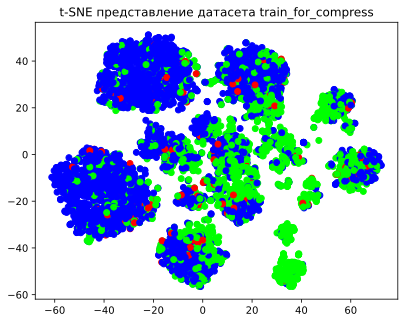

In [118]:
# визуализируем распределение классов датасета  train_for_compress
plt.scatter(
    x = points[:, 0],
    y = points[:, 1],
    cmap = 'brg',
    c = target_lda
)
plt.title('t-SNE представление датасета train_for_compress')
plt.show()

Визуализируем распределение для датасета **train_for_compress_polynom**.

In [119]:
# объявляем объект t-SNE
tsne = TSNE(
    n_components = n_components,
    perplexity = perplexity,
    early_exaggeration = early_exaggeration,
    random_state = RANDOM_STATE
)

In [120]:
# сжимаем данные
points = tsne.fit_transform(train_for_compress_polynom)

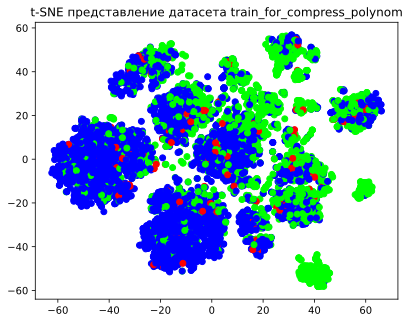

In [121]:
# визуализируем распределение классов датасета features_train
plt.scatter(
    x = points[:, 0],
    y = points[:, 1],
    cmap = 'brg',
    c = target_lda
)
plt.title('t-SNE представление датасета train_for_compress_polynom')
plt.show()

Представление сжатых с помощью t-SNE данных позволяет сделать вывод, что разделение классов лучше на данных с полиномиальными признаками.

Малочисленный класс **'D'** сильно перемешан среди более многочисленных классов **'C'** и **'D'**.

### <font color='mediumblue'>**Выводы по п. 1.3 Визуальное представление данных высокой размерности**</font>

---

**(1)** визуализация распределения классов датасетов **train_for_compress** и **train_for_compress_polynom**, реализованная с помощью метода PCA и выбора двух главных компонент, показала, что классы целевого признака очень плохо разделяются на группы, хаотично перемешаны.

**(2)** визуализация распределения классов датасета **train_for_compress**, реализованная с помощью метода LDA, показала, что два преобладающих класса хотя и довольно сильно перемешиваются. однако различимы на рисунке. Класс с наименьшими значениями хаотично распределен между точками преобладающих классов. Распределение классов датасета с полиномиальными признаками **train_for_compress_polynom** визуально напоминает проекцию точек первого рисунка на ось Ох. На рисунке с полиномиальными признаками можно предположить лучшее распределение классов, но уверенный вывод об этом сделать нельзя.

**(3)** С помощью t-SNE проведено сжатие данных датасетов **train_for_compress** и **train_for_compress_polynom**, подготовленных для передачи в машинное обучение и включающих только числовые признаки. Сравнение двух изображений распределения классов целевого признака показало, что классы лучше разделяются на данных с полиномиальными признаками.

**(4)** Из трех рассмотренных методов именно t-SNE позволил лучше всего распределить классы целевого признака на группы. Однако, этот метод непосредственно в машинном обучении не имеет широкого применения. Спект его полезности ограничивается визуализацией сжатого многомерного пространства в 2D.

## <font color='green'>**2 ПОСТРОЕНИЕ МОДЕЛИ МАШИННОГО ОБУЧЕНИЯ**</font>

---

### <font color='green'>**2.1 Обучение модели CatBoost**</font>

---

Для обучения моделей, основанных на решающих деревьях, - **CatBoost** и **XGBoost**, - будет использован датасет **train_features**, выбросы в котором не обработаны. Алгоритмы этих моделей устойчивы к выбросам.

In [122]:
# для снижения возможного переобучения модели при кросс-валидации
# для задачи классификации целесообразно добавить стратификацию классов
# для каждого fold (созданная переменная cv
# будет использована при обучении всех моделей в этом проекте)
cv = StratifiedKFold(
    n_splits = 5,
    shuffle = True,
    random_state = RANDOM_STATE)

In [123]:
# зададим score_funk для отбора наиболее важных признаков
# в пайплайне с помощью SelektKBest
score_func = chi2

In [124]:
# создадим трансформер для категориальных признаков
categorical_transformer = make_pipeline(
    TargetEncoder(cols = cat_columns)
)

In [125]:
# создадим препроцессор
catboost_preprocessor = ColumnTransformer(
    transformers = [
        ('cat', categorical_transformer, cat_columns)
    ], remainder='passthrough'
)

In [126]:
# объявляем модель
catboost = CatBoostClassifier(
    random_state = RANDOM_STATE,
    logging_level = 'Silent',
    loss_function = 'MultiClassOneVsAll'
)

In [127]:
# объявляем объект конвейера
pipeline_catboost = imb_pipeline([
    ('catboost_preprocessor', catboost_preprocessor),
    ('upsampler', SMOTETomek()),
    ('feature_select', SelectKBest(score_func = score_func)),
    ('catboost', catboost)
])

In [128]:
# визуализируем пайплайн
pipeline_catboost

Pipeline(steps=[('catboost_preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('cat',
                                                  Pipeline(steps=[('targetencoder',
                                                                   TargetEncoder(cols=['drug',
                                                                                       'sex',
                                                                                       'ascites',
                                                                                       'hepatomegaly',
                                                                                       'spiders',
                                                                                       'edema']))]),
                                                  ['drug', 'sex', 'ascites',
                                                   'hepatomegaly', 'spiders',
                                                   'edema'])])),
                ('upsampler', SMOTETomek()),
                ('feature_select',
                 SelectKBest(score_func=<function chi2 at 0x7d18de7a5240>)),
                ('catboost',
                 <catboost.core.CatBoostClassifier object at 0x7d18a909e0b0>)])

In [129]:
# получим список гиперпараметров пайплайна
pd.DataFrame(pipeline_catboost.get_params().keys())

,0
0,memory
1,steps
2,verbose
3,catboost_preprocessor
4,upsampler
5,feature_select
6,catboost
7,catboost_preprocessor__n_jobs
8,catboost_preprocessor__remainder
9,catboost_preprocessor__sparse_threshold


In [130]:
# создаем словарь с гиперпараметрами для отбора
# лучших гиперпараметров с помощью кроссвалидации
params_catboost = {
    'feature_select__k': ['all']
}

In [131]:
# объявляем объект RandomizedSearchCV
grid_catboost = RandomizedSearchCV(
    estimator = pipeline_catboost,
    param_distributions = params_catboost,
    n_iter = 10,
    scoring = 'f1_weighted',
    verbose = 1,
    cv = cv,
    refit = True,
    random_state = RANDOM_STATE,
    n_jobs = -1)

In [132]:
# обучаем модель
start = datetime.now()

grid_catboost.fit(train_features, target_numeric)

time_spent = datetime.now() - start
print('Время обучения модели:\n',
      time_spent)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Время обучения модели:
 0:02:29.423606


In [133]:
# сохраним лучшую модель в переменную
best_catboost = grid_catboost.best_estimator_
best_catboost

Pipeline(steps=[('catboost_preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('cat',
                                                  Pipeline(steps=[('targetencoder',
                                                                   TargetEncoder(cols=['drug',
                                                                                       'sex',
                                                                                       'ascites',
                                                                                       'hepatomegaly',
                                                                                       'spiders',
                                                                                       'edema']))]),
                                                  ['drug', 'sex', 'ascites',
                                                   'hepatomegaly', 'spiders',
                                                   'edema'])])),
                ('upsampler', SMOTETomek()),
                ('feature_select',
                 SelectKBest(k='all',
                             score_func=<function chi2 at 0x7d18de7a5240>)),
                ('catboost',
                 <catboost.core.CatBoostClassifier object at 0x7d18a8ebdc60>)])

In [134]:
# выведем на экран гиперпараметры лучшей модели
grid_catboost.best_params_

{'feature_select__k': 'all'}

In [135]:
# выведем значение метрики 'f1_weighted' лучшей модели
grid_catboost.best_score_

0.812765933542668

In [136]:
# получим предсказания модели на обучающих признаках
preds_train = best_catboost.predict(train_features)

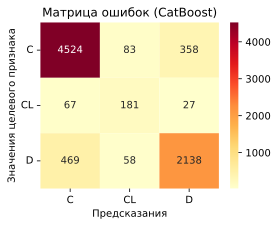

In [137]:
# построим матрицу ошибок
plt.figure(figsize = (4, 3))

confmatrix = pd.DataFrame(confusion_matrix(
        target_numeric,
        preds_train),
        index = np.unique(target),
        columns = np.unique(target)
    )
f = sns.heatmap(confmatrix,
                annot = True,
                cmap = 'YlOrRd',
                fmt = 'g')

f.set_title('Матрица ошибок (CatBoost)')
f.set_xlabel('Предсказания')
f.set_ylabel('Значения целевого признака')
plt.yticks(rotation = 0)
plt.show()

In [138]:
# выведем отчет об итогах обучения
print(classification_report(
    target_numeric,
    preds_train
))

              precision    recall  f1-score   support

           0       0.89      0.91      0.90      4965
           1       0.56      0.66      0.61       275
           2       0.85      0.80      0.82      2665

    accuracy                           0.87      7905
   macro avg       0.77      0.79      0.78      7905
weighted avg       0.87      0.87      0.87      7905



Для формирования submit-файла необходимо получить предсказания вероятности каждого типа статуса на основе датасета test.

In [139]:
# получаем вероятности типов статусов каждого пациента
probabylity = pd.DataFrame(best_catboost.predict_proba(test))

In [140]:
# переименуем названия столбцов таблицы с вероятностями статусов
correct_names = ['Status_C', 'Status_CL', 'Status_D']
probabylity.columns = correct_names
probabylity.head(3)

,Status_C,Status_CL,Status_D
0,0.611029,0.017151,0.452979
1,0.557366,0.246246,0.067650
2,0.051351,0.021629,0.939605


In [141]:
# согласно техзадания, каждое предскзазанное число
# должно быть округлено до 6 десятичных знаков
probabylity = probabylity.round(6)

In [142]:
# объединим датасеты test_id и probabylity
submit = pd.DataFrame()

submit['id'] = test_id
submit[correct_names] = probabylity
submit.head()

,id,Status_C,Status_CL,Status_D
0,7905,0.611029,0.017151,0.452979
1,7906,0.557366,0.246246,0.067650
2,7907,0.051351,0.021629,0.939605
3,7908,0.928325,0.006998,0.056818
4,7909,0.730743,0.093732,0.132114


In [143]:
# сохраним предсказанные результаты в csv-файл
submit.to_csv('submit.csv', index = False)

### <font color='green'>**2.2 Обучение модели XGBoost**</font>

---

In [144]:
# создадим трансформер для категориальных признаков
categorical_transformer = make_pipeline(
    TargetEncoder(cols = cat_columns)
)

In [145]:
# создадим препроцессор
preprocessor = ColumnTransformer(
    transformers = [
        ('cat', categorical_transformer, cat_columns)
    ], remainder='passthrough'
)

In [146]:
# объявляем модель
xgboost = XGBClassifier(
    objective='multi_logloss',
    tree_method = 'hist',
    verbosity = 0,
    silent = True,
    random_state = RANDOM_STATE
)

In [147]:
# объявляем объект конвейера
pipeline_xgboost = imb_pipeline([
    ('preprocessor', preprocessor),
    ('upsampler', SMOTETomek()),
    ('feature_select', SelectKBest(score_func = score_func)),
    ('xgboost', xgboost)
])

In [148]:
# визуализируем пайплайн
pipeline_xgboost

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('cat',
                                                  Pipeline(steps=[('targetencoder',
                                                                   TargetEncoder(cols=['drug',
                                                                                       'sex',
                                                                                       'ascites',
                                                                                       'hepatomegaly',
                                                                                       'spiders',
                                                                                       'edema']))]),
                                                  ['drug', 'sex', 'ascites',
                                                   'hepatomegaly', 'spiders',
                                                   'edema'])])),
                ('upsampler', SMOTETomek()),
                ('feature_select',
                 SelectKBest(score_func=<function ch...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi_logloss', ...))])

In [149]:
# получим список гиперпараметров пайплайна
pd.DataFrame(pipeline_xgboost.get_params().keys())

,0
0,memory
1,steps
2,verbose
3,preprocessor
4,upsampler
5,feature_select
6,xgboost
7,preprocessor__n_jobs
8,preprocessor__remainder
9,preprocessor__sparse_threshold


In [150]:
# создаем словарь с гиперпараметрами для отбора
# лучших гиперпараметров с помощью кроссвалидации
params_xgboost = {
    'feature_select__k': ['all'],
    'xgboost__n_estimators': [200, 300, 400, 500, 600],
    'xgboost__learning_rate': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.5]
}

In [151]:
# объявляем объект RandomizedSearchCV
grid_xgboost = RandomizedSearchCV(
    estimator = pipeline_xgboost,
    param_distributions = params_xgboost,
    n_iter = 10,
    scoring = 'f1_weighted',
    verbose = 1,
    cv = cv,
    refit = True,
    random_state = RANDOM_STATE,
    n_jobs = -1)

In [152]:
# обучаем модель
start = datetime.now()

grid_xgboost.fit(train_features, target_numeric)

time_spent = datetime.now() - start
print('Время обучения модели :\n',
      time_spent)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Время обучения модели :
 0:07:42.802047


In [153]:
# сохраним лучшую модель в переменную
best_xgboost = grid_xgboost.best_estimator_
best_xgboost

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('cat',
                                                  Pipeline(steps=[('targetencoder',
                                                                   TargetEncoder(cols=['drug',
                                                                                       'sex',
                                                                                       'ascites',
                                                                                       'hepatomegaly',
                                                                                       'spiders',
                                                                                       'edema']))]),
                                                  ['drug', 'sex', 'ascites',
                                                   'hepatomegaly', 'spiders',
                                                   'edema'])])),
                ('upsampler', SMOTETomek()),
                ('feature_select',
                 SelectKBest(k='all',
                             score_func=<fu...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.05,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=600, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi:softprob', ...))])

In [154]:
# выведем на экран гиперпараметры лучшей модели
grid_xgboost.best_params_

{'xgboost__n_estimators': 600,
 'xgboost__learning_rate': 0.05,
 'feature_select__k': 'all'}

In [155]:
# получим предсказания модели на обучающих признаках
preds_train = best_xgboost.predict(train_features)

In [156]:
# выведем значение метрики 'f1_weighted' лучшей модели
grid_xgboost.best_score_

0.8165146497621565

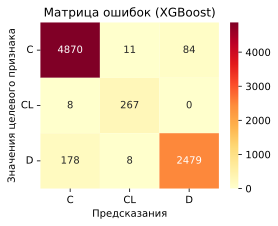

In [157]:
# построим матрицу ошибок
plt.figure(figsize = (4, 3))

confmatrix = pd.DataFrame(confusion_matrix(
        target_numeric,
        preds_train),
        index = np.unique(target),
        columns = np.unique(target)
    )
f = sns.heatmap(confmatrix,
                annot = True,
                cmap = 'YlOrRd',
                fmt = 'g')

f.set_title('Матрица ошибок (XGBoost)')
f.set_xlabel('Предсказания')
f.set_ylabel('Значения целевого признака')
plt.yticks(rotation = 0)
plt.show()

In [158]:
# выведем отчет об итогах обучения
print(classification_report(
    target_numeric,
    preds_train
))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      4965
           1       0.93      0.97      0.95       275
           2       0.97      0.93      0.95      2665

    accuracy                           0.96      7905
   macro avg       0.95      0.96      0.96      7905
weighted avg       0.96      0.96      0.96      7905



Для формирования submit-файла необходимо получить предсказания вероятности каждого типа статуса на основе датасета test.

In [159]:
# получаем вероятности типов статусов каждого пациента
probabylity = pd.DataFrame(
    best_xgboost.predict_proba(test))

In [160]:
# переименуем названия столбцов таблицы с вероятностями статусов
correct_names = ['Status_C', 'Status_CL', 'Status_D']
probabylity.columns = correct_names
probabylity.head(3)

,Status_C,Status_CL,Status_D
0,0.351382,0.005170,0.643448
1,0.775611,0.133251,0.091137
2,0.003007,0.000507,0.996486


In [161]:
# согласно техзадания, каждое предскзазанное число
# должно быть округлено до 6 десятичных знаков
probabylity = probabylity.round(6)

In [162]:
# объединим датасеты test_id и probabylity
submit = pd.DataFrame()

submit['id'] = test_id
submit[correct_names] = probabylity
submit.head()

,id,Status_C,Status_CL,Status_D
0,7905,0.351382,0.005170,0.643448
1,7906,0.775611,0.133251,0.091137
2,7907,0.003007,0.000507,0.996486
3,7908,0.963065,0.001510,0.035424
4,7909,0.886481,0.058642,0.054878


In [163]:
# сохраним предсказанные результаты в csv-файл
submit.to_csv('submit.csv', index = False)

### <font color='green'>**2.3 Обучение модели CatBoost на данных, сжатых с помощью PCA**</font>

---

In [164]:
# объявляем модель
catboost = CatBoostClassifier(
    random_state = RANDOM_STATE,
    logging_level = 'Silent',
    loss_function = 'MultiClassOneVsAll'
)

Датасеты для сжатия подготовлены (выбросы обработаны, категориальыне признаки закодированы, значения центрированы), поэтому в пайплайне не требуется препроцессор.

In [165]:
# объявляем объект конвейера
pipeline_catboost = imb_pipeline([
    ('upsampler', SMOTETomek()),
    ('pca', PCA(random_state = RANDOM_STATE)),
    ('catboost', catboost)
])

In [166]:
# визуализируем пайплайн
pipeline_catboost

Pipeline(steps=[('upsampler', SMOTETomek()), ('pca', PCA(random_state=1)),
                ('catboost',
                 <catboost.core.CatBoostClassifier object at 0x7d18a8f99c90>)])

In [167]:
# получим список гиперпараметров пайплайна
pd.DataFrame(pipeline_catboost.get_params().keys())

,0
0,memory
1,steps
2,verbose
3,upsampler
4,pca
5,catboost
6,upsampler__n_jobs
7,upsampler__random_state
8,upsampler__sampling_strategy
9,upsampler__smote


In [168]:
# создаем словарь с гиперпараметрами для отбора
# лучших гиперпараметров с помощью кроссвалидации
params_catboost = {
    'pca__n_components': [13, 15, 17]
}

In [169]:
# объявляем объект RandomizedSearchCV
grid_catboost = RandomizedSearchCV(
    estimator = pipeline_catboost,
    param_distributions = params_catboost,
    n_iter = 10,
    scoring = 'f1_weighted',
    verbose = 1,
    cv = cv,
    refit = True,
    random_state = RANDOM_STATE,
    n_jobs = -1)

In [170]:
# обучаем модель
start = datetime.now()

grid_catboost.fit(train_for_compress, target)

time_spent = datetime.now() - start
print('Время обучения модели:\n',
      time_spent)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Время обучения модели:
 0:05:54.358681


In [171]:
# сохраним лучшую модель в переменную
best_catboost = grid_catboost.best_estimator_
best_catboost

Pipeline(steps=[('upsampler', SMOTETomek()),
                ('pca', PCA(n_components=17, random_state=1)),
                ('catboost',
                 <catboost.core.CatBoostClassifier object at 0x7d18a8f9b0d0>)])

In [172]:
# выведем на экран гиперпараметры лучшей модели
grid_catboost.best_params_

{'pca__n_components': 17}

In [173]:
# выведем значение метрики 'f1_weighted' лучшей модели
grid_catboost.best_score_

0.7765440623176973

In [174]:
# получим предсказания модели на обучающих признаках
preds_train = best_catboost.predict(train_for_compress)

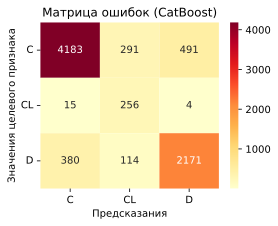

In [175]:
# построим матрицу ошибок
plt.figure(figsize = (4, 3))

confmatrix = pd.DataFrame(confusion_matrix(
        target,
        preds_train),
        index = np.unique(target),
        columns = np.unique(target)
    )
f = sns.heatmap(confmatrix,
                annot = True,
                cmap = 'YlOrRd',
                fmt = 'g')

f.set_title('Матрица ошибок (CatBoost)')
f.set_xlabel('Предсказания')
f.set_ylabel('Значения целевого признака')
plt.yticks(rotation = 0)
plt.show()

In [176]:
# выведем отчет об итогах обучения
print(classification_report(
    target,
    preds_train
))

              precision    recall  f1-score   support

           C       0.91      0.84      0.88      4965
          CL       0.39      0.93      0.55       275
           D       0.81      0.81      0.81      2665

    accuracy                           0.84      7905
   macro avg       0.71      0.86      0.75      7905
weighted avg       0.86      0.84      0.84      7905



Для формирования submit-файла необходимо получить предсказания вероятности каждого типа статуса на основе датасета test.

In [177]:
# получаем вероятности типов статусов каждого пациента
probabylity = pd.DataFrame(
    best_catboost.predict_proba(test_for_compress))

In [178]:
# переименуем названия столбцов таблицы с вероятностями статусов
correct_names = ['Status_C', 'Status_CL', 'Status_D']
probabylity.columns = correct_names
probabylity.head(3)

,Status_C,Status_CL,Status_D
0,0.629809,0.027509,0.406860
1,0.489609,0.268879,0.103820
2,0.020013,0.042305,0.940853


In [179]:
# согласно техзадания, каждое предскзазанное число
# должно быть округлено до 6 десятичных знаков
probabylity = probabylity.round(6)

In [180]:
# объединим датасеты test_id и probabylity
submit = pd.DataFrame()

submit['id'] = test_id
submit[correct_names] = probabylity
submit.head()

,id,Status_C,Status_CL,Status_D
0,7905,0.629809,0.027509,0.406860
1,7906,0.489609,0.268879,0.103820
2,7907,0.020013,0.042305,0.940853
3,7908,0.797350,0.050190,0.107943
4,7909,0.643991,0.055029,0.293230


In [181]:
# сохраним предсказанные результаты в csv-файл
submit.to_csv('submit.csv', index = False)

### <font color='green'>**2.4 Обучение модели CatBoost на данных с полиномиальными признаками, сжатых с помощью PCA**</font>

---

In [182]:
# объявляем модель
catboost = CatBoostClassifier(
    random_state = RANDOM_STATE,
    logging_level = 'Silent',
    loss_function = 'MultiClassOneVsAll'
)

Датасеты для сжатия подготовлены (выбросы обработаны, категориальные признаки закодированы, значения центрированы), поэтому в пайплайне не требуется препроцессор.

In [183]:
# объявляем объект конвейера
pipeline_catboost = imb_pipeline([
    ('upsampler', SMOTETomek()),
    ('variance_removal', VarianceThreshold(0.9*(1-0.9))),
    ('pca', PCA(random_state = RANDOM_STATE)),
    ('catboost', catboost)
])

In [184]:
# визуализируем пайплайн
pipeline_catboost

Pipeline(steps=[('upsampler', SMOTETomek()),
                ('variance_removal',
                 VarianceThreshold(threshold=0.08999999999999998)),
                ('pca', PCA(random_state=1)),
                ('catboost',
                 <catboost.core.CatBoostClassifier object at 0x7d18a8f9b1f0>)])

In [185]:
# получим список гиперпараметров пайплайна
pd.DataFrame(pipeline_catboost.get_params().keys())

,0
0,memory
1,steps
2,verbose
3,upsampler
4,variance_removal
5,pca
6,catboost
7,upsampler__n_jobs
8,upsampler__random_state
9,upsampler__sampling_strategy


In [186]:
# создаем словарь с гиперпараметрами для отбора
# лучших гиперпараметров с помощью кроссвалидации
params_catboost = {
    'pca__n_components': [110]
}

In [187]:
# объявляем объект для поиска апо сетке
grid_catboost = RandomizedSearchCV(
    estimator = pipeline_catboost,
    param_distributions = params_catboost,
    n_iter = 10,
    scoring = 'f1_weighted',
    verbose = 1,
    cv = cv,
    refit = True,
    random_state = RANDOM_STATE,
    n_jobs = -1)

In [188]:
# обучаем модель
start = datetime.now()

grid_catboost.fit(train_for_compress_polynom, target)

time_spent = datetime.now() - start
print('Время обучения модели:\n',
      time_spent)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Время обучения модели:
 0:11:42.586858


In [189]:
# сохраним лучшую модель в переменную
best_catboost = grid_catboost.best_estimator_
best_catboost

Pipeline(steps=[('upsampler', SMOTETomek()),
                ('variance_removal',
                 VarianceThreshold(threshold=0.08999999999999998)),
                ('pca', PCA(n_components=110, random_state=1)),
                ('catboost',
                 <catboost.core.CatBoostClassifier object at 0x7d18a8f9b880>)])

In [190]:
# выведем на экран гиперпараметры лучшей модели
grid_catboost.best_params_

{'pca__n_components': 110}

In [191]:
# выведем значение метрики 'f1_weighted' лучшей модели
grid_catboost.best_score_

0.7791721245118188

In [192]:
# получим предсказания модели на обучающих признаках
preds_train = best_catboost.predict(train_for_compress_polynom)

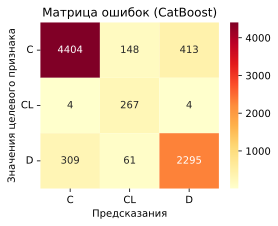

In [193]:
# построим матрицу ошибок
plt.figure(figsize = (4, 3))

confmatrix = pd.DataFrame(confusion_matrix(
        target,
        preds_train),
        index = np.unique(target),
        columns = np.unique(target)
    )
f = sns.heatmap(confmatrix,
                annot = True,
                cmap = 'YlOrRd',
                fmt = 'g')

f.set_title('Матрица ошибок (CatBoost)')
f.set_xlabel('Предсказания')
f.set_ylabel('Значения целевого признака')
plt.yticks(rotation = 0)
plt.show()

In [194]:
# выведем отчет об итогах обучения
print(classification_report(
    target,
    preds_train
))

              precision    recall  f1-score   support

           C       0.93      0.89      0.91      4965
          CL       0.56      0.97      0.71       275
           D       0.85      0.86      0.85      2665

    accuracy                           0.88      7905
   macro avg       0.78      0.91      0.82      7905
weighted avg       0.89      0.88      0.88      7905



Для формирования submit-файла необходимо получить предсказания вероятности каждого типа статуса на основе датасета test.

In [195]:
# получаем вероятности типов статусов каждого пациента
probabylity = pd.DataFrame(
    best_catboost.predict_proba(test_for_compress_polynom))

In [196]:
# переименуем названия столбцов таблицы с вероятностями статусов
correct_names = ['Status_C', 'Status_CL', 'Status_D']
probabylity.columns = correct_names
probabylity.head(3)

,Status_C,Status_CL,Status_D
0,0.526745,0.052994,0.388312
1,0.377720,0.362314,0.121374
2,0.054957,0.010235,0.940884


In [197]:
# согласно техзадания, каждое предскзазанное число
# должно быть округлено до 6 десятичных знаков
probabylity = probabylity.round(6)

In [198]:
# объединим датасеты test_id и probabylity
submit = pd.DataFrame()

submit['id'] = test_id
submit[correct_names] = probabylity
submit.head()

,id,Status_C,Status_CL,Status_D
0,7905,0.526745,0.052994,0.388312
1,7906,0.377720,0.362314,0.121374
2,7907,0.054957,0.010235,0.940884
3,7908,0.823069,0.076358,0.069051
4,7909,0.712241,0.046585,0.270411


In [199]:
# сохраним предсказанные результаты в csv-файл
submit.to_csv('submit.csv', index = False)

### <font color='green'>**2.5 Обучение модели XGBoost на данных, сжатых с помощью PCA**</font>

---

In [200]:
# объявляем модель
xgboost = XGBClassifier(
    objective='multi_logloss',
    tree_method = 'hist',
    verbosity = 0,
    silent = True,
    random_state = RANDOM_STATE
)

In [201]:
# объявляем объект конвейера
pipeline_xgboost = imb_pipeline([
    ('upsampler', SMOTETomek()),
    ('pca', PCA(random_state = RANDOM_STATE)),
    ('xgboost', xgboost)
])

In [202]:
# визуализируем пайплайн
pipeline_xgboost

Pipeline(steps=[('upsampler', SMOTETomek()), ('pca', PCA(random_state=1)),
                ('xgboost',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi_logloss', ...))])

In [203]:
# получим список гиперпараметров пайплайна
pd.DataFrame(pipeline_xgboost.get_params().keys())

,0
0,memory
1,steps
2,verbose
3,upsampler
4,pca
5,xgboost
6,upsampler__n_jobs
7,upsampler__random_state
8,upsampler__sampling_strategy
9,upsampler__smote


In [204]:
# создаем словарь с гиперпараметрами для отбора
# лучших гиперпараметров с помощью кроссвалидации
params_xgboost = {
    'pca__n_components': [13, 15, 17],
    'xgboost__n_estimators': [200, 300, 400, 500, 600],
    'xgboost__learning_rate': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.5]
}

In [205]:
# объявляем объект RandomizedSearchCV
grid_xgboost = RandomizedSearchCV(
    estimator = pipeline_xgboost,
    param_distributions = params_xgboost,
    n_iter = 10,
    scoring = 'f1_weighted',
    verbose = 1,
    cv = cv,
    refit = True,
    random_state = RANDOM_STATE,
    n_jobs = -1)

Напомним, что ранее для модели XGBoost была подготовлена целевая переменаня **target_xgboost**.

In [206]:
# обучаем модель
start = datetime.now()

grid_xgboost.fit(train_for_compress, target_numeric)

time_spent = datetime.now() - start
print('Время обучения модели:\n',
      time_spent)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Время обучения модели:
 0:07:44.163605


In [207]:
# сохраним лучшую модель в переменную
best_xgboost = grid_xgboost.best_estimator_
best_xgboost

Pipeline(steps=[('upsampler', SMOTETomek()),
                ('pca', PCA(n_components=17, random_state=1)),
                ('xgboost',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.05,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=500, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi:softprob', ...))])

In [208]:
# выведем на экран гиперпараметры лучшей модели
grid_xgboost.best_params_

{'xgboost__n_estimators': 500,
 'xgboost__learning_rate': 0.05,
 'pca__n_components': 17}

In [209]:
# получим предсказания модели на обучающих признаках
preds_train = best_xgboost.predict(train_for_compress)

In [210]:
# выведем значение метрики 'f1_weighted' лучшей модели
grid_xgboost.best_score_

0.7843125827278429

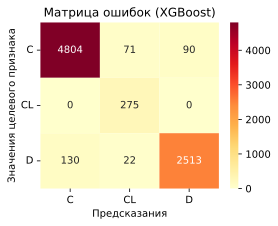

In [211]:
# построим матрицу ошибок
plt.figure(figsize = (4, 3))

confmatrix = pd.DataFrame(confusion_matrix(
        target_numeric,
        preds_train),
        index = np.unique(target),
        columns = np.unique(target)
    )
f = sns.heatmap(confmatrix,
                annot = True,
                cmap = 'YlOrRd',
                fmt = 'g')

f.set_title('Матрица ошибок (XGBoost)')
f.set_xlabel('Предсказания')
f.set_ylabel('Значения целевого признака')
plt.yticks(rotation = 0)
plt.show()

In [212]:
# выведем отчет об итогах обучения
print(classification_report(
    target_numeric,
    preds_train
))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97      4965
           1       0.75      1.00      0.86       275
           2       0.97      0.94      0.95      2665

    accuracy                           0.96      7905
   macro avg       0.90      0.97      0.93      7905
weighted avg       0.96      0.96      0.96      7905



Для формирования submit-файла необходимо получить предсказания вероятности каждого типа статуса на основе датасета test.

In [213]:
# получаем вероятности типов статусов каждого пациента
probabylity = pd.DataFrame(
    best_xgboost.predict_proba(test_for_compress))

In [214]:
# переименуем названия столбцов таблицы с вероятностями статусов
correct_names = ['Status_C', 'Status_CL', 'Status_D']
probabylity.columns = correct_names
probabylity.head(3)

,Status_C,Status_CL,Status_D
0,0.661681,0.027011,0.311308
1,0.839567,0.064640,0.095793
2,0.003232,0.016547,0.980221


In [215]:
# согласно техзадания, каждое предскзазанное число
# должно быть округлено до 6 десятичных знаков
probabylity = probabylity.round(6)

In [216]:
# объединим датасеты test_id и probabylity
submit = pd.DataFrame()

submit['id'] = test_id
submit[correct_names] = probabylity
submit.head()

,id,Status_C,Status_CL,Status_D
0,7905,0.661681,0.027011,0.311308
1,7906,0.839567,0.064640,0.095793
2,7907,0.003232,0.016547,0.980221
3,7908,0.870276,0.015173,0.114551
4,7909,0.511281,0.009899,0.478820


In [217]:
# сохраним предсказанные результаты в csv-файл
submit.to_csv('submit.csv', index = False)

### <font color='green'>**2.6 Обучение модели XGBoost на данных с полиномиальными признаками, сжатых с помощью PCA**</font>

---

In [218]:
# объявляем модель
xgboost = XGBClassifier(
    objective='multi_logloss',
    tree_method = 'hist',
    verbosity = 0,
    silent = True,
    random_state = RANDOM_STATE
)

In [219]:
# объявляем объект конвейера
pipeline_xgboost = imb_pipeline([
    ('upsampler', SMOTETomek()),
    ('variance_removal', VarianceThreshold(0.9*(1-0.9))),
    ('pca', PCA(random_state = RANDOM_STATE)),
    ('xgboost', xgboost)
])

In [220]:
# визуализируем пайплайн
pipeline_xgboost

Pipeline(steps=[('upsampler', SMOTETomek()),
                ('variance_removal',
                 VarianceThreshold(threshold=0.08999999999999998)),
                ('pca', PCA(random_state=1)),
                ('xgboost',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metr...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi_logloss', ...))])

In [221]:
# получим список гиперпараметров пайплайна
pd.DataFrame(pipeline_xgboost.get_params().keys())

,0
0,memory
1,steps
2,verbose
3,upsampler
4,variance_removal
5,pca
6,xgboost
7,upsampler__n_jobs
8,upsampler__random_state
9,upsampler__sampling_strategy


In [222]:
# создаем словарь с гиперпараметрами для отбора
# лучших гиперпараметров с помощью кроссвалидации
params_xgboost = {
    'pca__n_components': [145],
    'xgboost__n_estimators': [200],
    'xgboost__learning_rate': [0.001, 0.01, 0.05, 0.1, 0.5]
}

In [223]:
# объявляем объект RandomizedSearchCV
grid_xgboost = RandomizedSearchCV(
    estimator = pipeline_xgboost,
    param_distributions = params_xgboost,
    n_iter = 10,
    scoring = 'f1_weighted',
    verbose = 1,
    cv = cv,
    refit = True,
    random_state = RANDOM_STATE,
    n_jobs = -1)

In [224]:
# обучаем модель
start = datetime.now()

grid_xgboost.fit(train_for_compress_polynom, target_numeric)

time_spent = datetime.now() - start
print('Время обучения модели:\n',
      time_spent)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Время обучения модели:
 0:17:13.071675


In [225]:
# сохраним лучшую модель в переменную
best_xgboost = grid_xgboost.best_estimator_
best_xgboost

Pipeline(steps=[('upsampler', SMOTETomek()),
                ('variance_removal',
                 VarianceThreshold(threshold=0.08999999999999998)),
                ('pca', PCA(n_components=145, random_state=1)),
                ('xgboost',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorica...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.5,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=200, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi:softprob', ...))])

In [226]:
# выведем на экран гиперпараметры лучшей модели
grid_xgboost.best_params_

{'xgboost__n_estimators': 200,
 'xgboost__learning_rate': 0.5,
 'pca__n_components': 145}

In [227]:
# получим предсказания модели на обучающих признаках
preds_train = best_xgboost.predict(train_for_compress_polynom)

In [228]:
# выведем значение метрики 'f1_weighted' лучшей модели
grid_xgboost.best_score_

0.7835809442494448

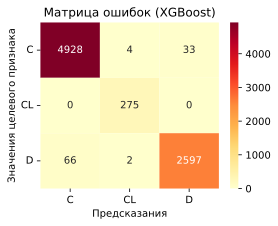

In [229]:
# построим матрицу ошибок
plt.figure(figsize = (4, 3))

confmatrix = pd.DataFrame(confusion_matrix(
        target_numeric,
        preds_train),
        index = np.unique(target),
        columns = np.unique(target)
    )
f = sns.heatmap(confmatrix,
                annot = True,
                cmap = 'YlOrRd',
                fmt = 'g')

f.set_title('Матрица ошибок (XGBoost)')
f.set_xlabel('Предсказания')
f.set_ylabel('Значения целевого признака')
plt.yticks(rotation = 0)
plt.show()

In [230]:
# выведем отчет об итогах обучения
print(classification_report(
    target_numeric,
    preds_train
))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4965
           1       0.98      1.00      0.99       275
           2       0.99      0.97      0.98      2665

    accuracy                           0.99      7905
   macro avg       0.98      0.99      0.99      7905
weighted avg       0.99      0.99      0.99      7905



Для формирования submit-файла необходимо получить предсказания вероятности каждого типа статуса на основе датасета test.

In [231]:
# получаем вероятности типов статусов каждого пациента
probabylity = pd.DataFrame(
    best_xgboost.predict_proba(test_for_compress_polynom))

In [232]:
# переименуем названия столбцов таблицы с вероятностями статусов
correct_names = ['Status_C', 'Status_CL', 'Status_D']
probabylity.columns = correct_names
probabylity.head(3)

,Status_C,Status_CL,Status_D
0,0.957103,0.000557,0.042340
1,0.987112,0.004306,0.008582
2,0.000283,0.000001,0.999715


In [233]:
# согласно техзадания, каждое предскзазанное число
# должно быть округлено до 6 десятичных знаков
probabylity = probabylity.round(6)

In [234]:
# объединим датасеты test_id и probabylity
submit = pd.DataFrame()

submit['id'] = test_id
submit[correct_names] = probabylity
submit.head()

,id,Status_C,Status_CL,Status_D
0,7905,0.957103,0.000557,0.042340
1,7906,0.987112,0.004306,0.008582
2,7907,0.000283,0.000001,0.999715
3,7908,0.999344,0.000131,0.000525
4,7909,0.943437,0.000030,0.056533


In [235]:
# сохраним предсказанные результаты в csv-файл
submit.to_csv('submit.csv', index = False)

### <font color='green'>**2.7 Обучение модели CatBoost на данных, сжатых с помощью LDA**</font>

---

In [236]:
# сформируем пайплайн
pipeline_catboost = make_pipeline(
    LinearDiscriminantAnalysis(),
    CatBoostClassifier(
    random_state = RANDOM_STATE,
    logging_level = 'Silent',
    loss_function = 'MultiClassOneVsAll')
)

In [237]:
# визуализируем пайплайн
pipeline_catboost

Pipeline(steps=[('lineardiscriminantanalysis', LinearDiscriminantAnalysis()),
                ('catboostclassifier',
                 <catboost.core.CatBoostClassifier object at 0x7d18aca60190>)])

In [238]:
# получим список гиперпараметров пайплайна
pd.DataFrame(pipeline_catboost.get_params().keys())

,0
0,memory
1,steps
2,verbose
3,lineardiscriminantanalysis
4,catboostclassifier
5,lineardiscriminantanalysis__covariance_estimator
6,lineardiscriminantanalysis__n_components
7,lineardiscriminantanalysis__priors
8,lineardiscriminantanalysis__shrinkage
9,lineardiscriminantanalysis__solver


In [239]:
# создаем словарь с гиперпараметрами для отбора
# лучших гиперпараметров с помощью кроссвалидации
params_catboost = {
    'lineardiscriminantanalysis__n_components': [2]
}

In [240]:
# объявляем объект RandomizedSearchCV
grid_catboost = RandomizedSearchCV(
    estimator = pipeline_catboost,
    param_distributions = params_catboost,
    n_iter = 10,
    scoring = 'f1_weighted',
    verbose = 1,
    cv = cv,
    refit = True,
    random_state = RANDOM_STATE,
    n_jobs = -1)

In [241]:
# обучаем модель
start = datetime.now()

grid_catboost.fit(train_for_compress, target_numeric)

time_spent = datetime.now() - start
print('Время обучения модели:\n',
      time_spent)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Время обучения модели:
 0:00:36.400119


In [242]:
# сохраним лучшую модель в переменную
best_catboost = grid_catboost.best_estimator_
best_catboost

Pipeline(steps=[('lineardiscriminantanalysis',
                 LinearDiscriminantAnalysis(n_components=2)),
                ('catboostclassifier',
                 <catboost.core.CatBoostClassifier object at 0x7d18aca63880>)])

In [243]:
# выведем на экран гиперпараметры лучшей модели
grid_catboost.best_params_

{'lineardiscriminantanalysis__n_components': 2}

In [244]:
# выведем значение метрики 'f1_weighted' лучшей модели
grid_catboost.best_score_

0.7793144375175716

In [245]:
# получим предсказания модели на обучающих признаках
preds_train = best_catboost.predict(train_for_compress)

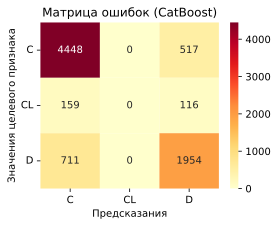

In [246]:
# построим матрицу ошибок
plt.figure(figsize = (4, 3))

confmatrix = pd.DataFrame(confusion_matrix(
        target_numeric,
        preds_train),
        index = np.unique(target),
        columns = np.unique(target)
    )
f = sns.heatmap(confmatrix,
                annot = True,
                cmap = 'YlOrRd',
                fmt = 'g')

f.set_title('Матрица ошибок (CatBoost)')
f.set_xlabel('Предсказания')
f.set_ylabel('Значения целевого признака')
plt.yticks(rotation = 0)
plt.show()

In [247]:
# выведем отчет об итогах обучения
print(classification_report(
    target_numeric,
    preds_train
))

              precision    recall  f1-score   support

           0       0.84      0.90      0.87      4965
           1       0.00      0.00      0.00       275
           2       0.76      0.73      0.74      2665

    accuracy                           0.81      7905
   macro avg       0.53      0.54      0.54      7905
weighted avg       0.78      0.81      0.79      7905



Для формирования submit-файла необходимо получить предсказания вероятности каждого типа статуса на основе датасета test.

In [248]:
# получаем вероятности типов статусов каждого пациента
probabylity = pd.DataFrame(
    best_catboost.predict_proba(test_for_compress))

In [249]:
# переименуем названия столбцов таблицы с вероятностями статусов
correct_names = ['Status_C', 'Status_CL', 'Status_D']
probabylity.columns = correct_names
probabylity.head(3)

,Status_C,Status_CL,Status_D
0,0.798915,0.015563,0.186047
1,0.930388,0.034956,0.034497
2,0.105705,0.011601,0.884695


In [250]:
# согласно техзадания, каждое предскзазанное число
# должно быть округлено до 6 десятичных знаков
probabylity = probabylity.round(6)

In [251]:
# объединим датасеты test_id и probabylity
submit = pd.DataFrame()

submit['id'] = test_id
submit[correct_names] = probabylity
submit.head()

,id,Status_C,Status_CL,Status_D
0,7905,0.798915,0.015563,0.186047
1,7906,0.930388,0.034956,0.034497
2,7907,0.105705,0.011601,0.884695
3,7908,0.913529,0.005076,0.082592
4,7909,0.771239,0.015969,0.215400


In [252]:
# сохраним предсказанные результаты в csv-файл
submit.to_csv('submit.csv', index = False)

### <font color='green'>**2.8 Обучение модели CatBoost на данных с полиномиальными признаками, сжатых с помощью LDA**</font>

---

In [253]:
catboost = CatBoostClassifier(
    random_state = RANDOM_STATE,
    logging_level = 'Silent',
    loss_function = 'MultiClassOneVsAll')

In [254]:
# сформируем пайплайн
pipeline_catboost = imb_pipeline([
    ('upsampler', SMOTETomek()),
    ('lda', LinearDiscriminantAnalysis()),
    ('catboost', catboost)
])

In [255]:
# визуализируем пайплайн
pipeline_catboost

Pipeline(steps=[('upsampler', SMOTETomek()),
                ('lda', LinearDiscriminantAnalysis()),
                ('catboost',
                 <catboost.core.CatBoostClassifier object at 0x7d18aeb9a740>)])

In [256]:
# получим список гиперпараметров пайплайна
pd.DataFrame(pipeline_catboost.get_params().keys())

,0
0,memory
1,steps
2,verbose
3,upsampler
4,lda
5,catboost
6,upsampler__n_jobs
7,upsampler__random_state
8,upsampler__sampling_strategy
9,upsampler__smote


In [257]:
# создаем словарь с гиперпараметрами для отбора
# лучших гиперпараметров с помощью кроссвалидации
params_catboost = {
    'lda__n_components': [2]
}

In [258]:
# объявляем объект RandomizedSearchCV
grid_catboost = RandomizedSearchCV(
    estimator = pipeline_catboost,
    param_distributions = params_catboost,
    n_iter = 10,
    scoring = 'f1_weighted',
    verbose = 1,
    cv = cv,
    refit = True,
    random_state = RANDOM_STATE,
    n_jobs = -1)

In [259]:
# обучаем модель
start = datetime.now()

grid_catboost.fit(train_for_compress_polynom, target_numeric)

time_spent = datetime.now() - start
print('Время обучения модели:\n',
      time_spent)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Время обучения модели:
 0:01:19.305035


In [260]:
# сохраним лучшую модель в переменную
best_catboost = grid_catboost.best_estimator_
best_catboost

Pipeline(steps=[('upsampler', SMOTETomek()),
                ('lda', LinearDiscriminantAnalysis(n_components=2)),
                ('catboost',
                 <catboost.core.CatBoostClassifier object at 0x7d18aadd2950>)])

In [261]:
# выведем на экран гиперпараметры лучшей модели
grid_catboost.best_params_

{'lda__n_components': 2}

In [262]:
# выведем значение метрики 'f1_weighted' лучшей модели
grid_catboost.best_score_

0.7373940023510043

In [263]:
# получим предсказания модели на обучающих признаках
preds_train = best_catboost.predict(train_for_compress_polynom)

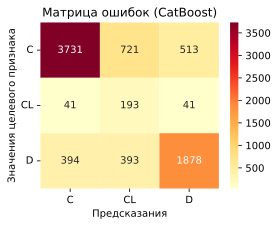

In [264]:
# построим матрицу ошибок
plt.figure(figsize = (4, 3))

confmatrix = pd.DataFrame(confusion_matrix(
        target_numeric,
        preds_train),
        index = np.unique(target),
        columns = np.unique(target)
    )
f = sns.heatmap(confmatrix,
                annot = True,
                cmap = 'YlOrRd',
                fmt = 'g')

f.set_title('Матрица ошибок (CatBoost)')
f.set_xlabel('Предсказания')
f.set_ylabel('Значения целевого признака')
plt.yticks(rotation = 0)
plt.show()

In [265]:
# выведем отчет об итогах обучения
print(classification_report(
    target_numeric,
    preds_train
))

              precision    recall  f1-score   support

           0       0.90      0.75      0.82      4965
           1       0.15      0.70      0.24       275
           2       0.77      0.70      0.74      2665

    accuracy                           0.73      7905
   macro avg       0.61      0.72      0.60      7905
weighted avg       0.83      0.73      0.77      7905



Для формирования submit-файла необходимо получить предсказания вероятности каждого типа статуса на основе датасета test.

In [266]:
# получаем вероятности типов статусов каждого пациента
probabylity = pd.DataFrame(
    best_catboost.predict_proba(test_for_compress_polynom))

In [267]:
# переименуем названия столбцов таблицы с вероятностями статусов
correct_names = ['Status_C', 'Status_CL', 'Status_D']
probabylity.columns = correct_names
probabylity.head(3)

,Status_C,Status_CL,Status_D
0,0.747253,0.037229,0.195381
1,0.419958,0.433619,0.140591
2,0.089059,0.000557,0.909738


In [268]:
# согласно техзадания, каждое предскзазанное число
# должно быть округлено до 6 десятичных знаков
probabylity = probabylity.round(6)

In [269]:
# объединим датасеты test_id и probabylity
submit = pd.DataFrame()

submit['id'] = test_id
submit[correct_names] = probabylity
submit.head()

,id,Status_C,Status_CL,Status_D
0,7905,0.747253,0.037229,0.195381
1,7906,0.419958,0.433619,0.140591
2,7907,0.089059,0.000557,0.909738
3,7908,0.874380,0.035570,0.082365
4,7909,0.655694,0.001317,0.356510


In [270]:
# сохраним предсказанные результаты в csv-файл
submit.to_csv('submit.csv', index = False)

# **<font color='crimson'>ОТЧЕТ ПО ПРОЕКТУ «Прогнозирование исхода лечения цирроза печени»</font>**

---

**(1)** Исходные данные проанализированы, проверены на наличие пропусков и явных дубликатов. Выбросы обработаны по следующему алгоритму: на основе межквартильного интервала вычислены левая и права границы выбросов. Выбросы, выходящие за левую и правую границы приравнены соответственно к значениям левой и правой границы. Это позволило сохранить данные по тем наблюдениям признаков, по которым выбросы отсутствуют.

**(2)** Проверка признаков датасета train на мультиколлинеарность показала отсутствие признаков с очень сильной линейной корреляцией.

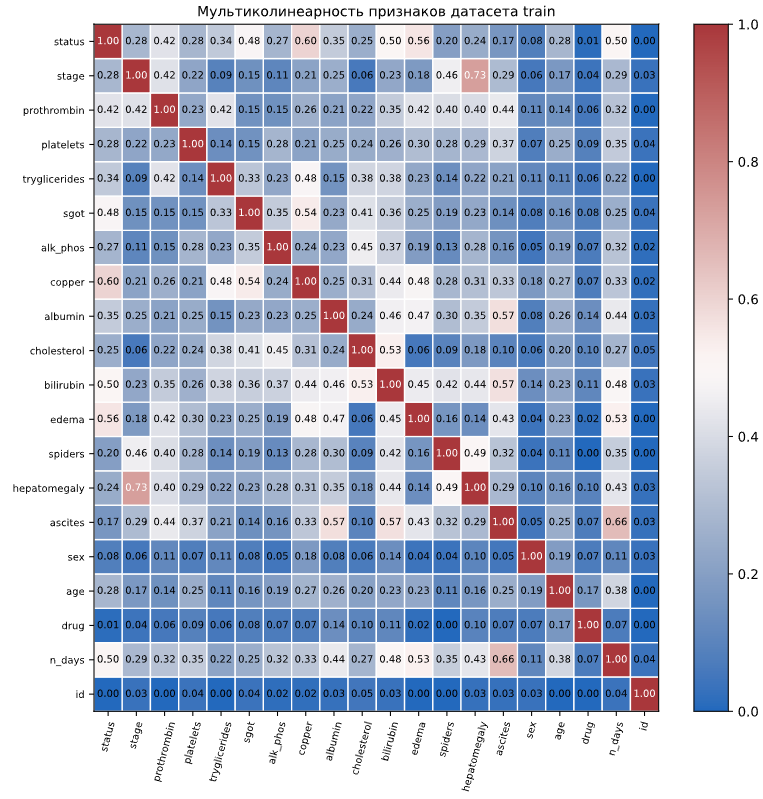

**(3)** Для сжатия данных с помощью алгоритмов PCA и LDA на основе датасета train_features, объединяющего числовые и категориальные признаки, подготовлены датасеты, включающие только числовые признаки:

 * **train_for_compress** (19 обучающих признаков)

 * **train_for_compress_polynom** (210 обучающих признаков, подготовленных с помощью функции PolynomialFeatures)


**(4)** Для машинного обучения с помощью алгоритма PCA реализован подбор главных компонент по датасетам **train_for_compress** и **train_for_compress_polynom**.

Объясненная дисперсия по компонентам и накопленная объясненная дисперсия по компонентам для датасета **train_for_compress** (19 признаков) представлена на рисунках:

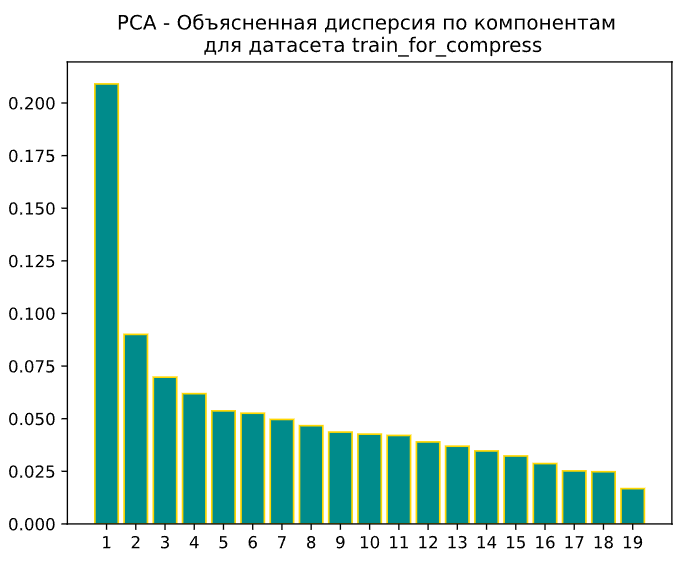

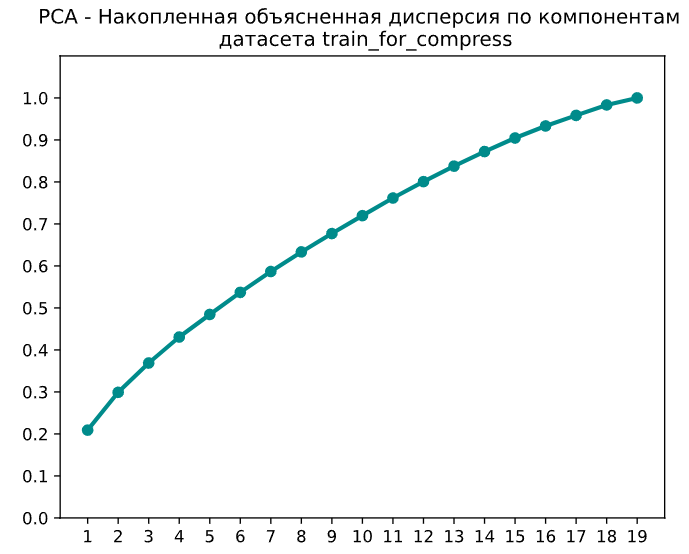

90% дисперсии объясняют первые 15 компонент из 19. 95% дисперсии объясняют первые 17 компонент из 19. Явно выраженного лидера (лидеров) среди компонент нет.

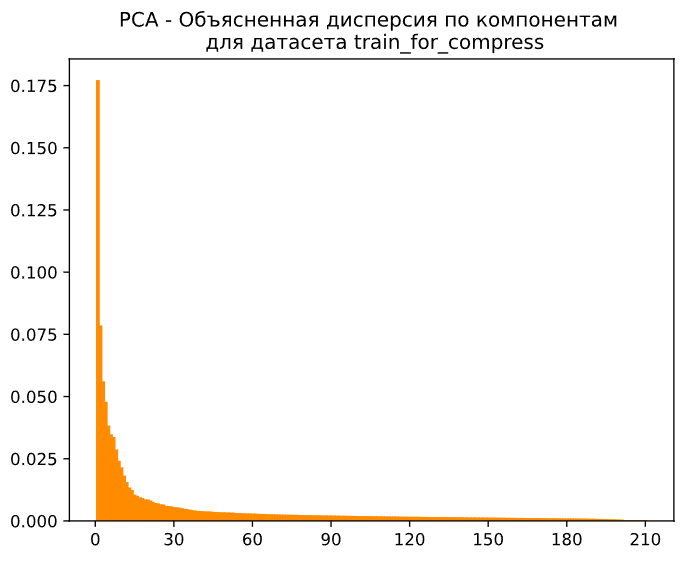

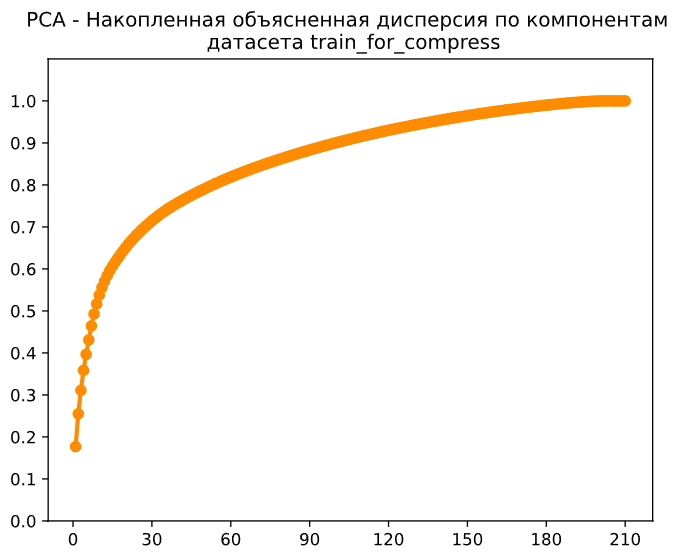

Для полиномиальных признаков также нельзя выделить ограниченную группу, которая описывала бы 90-95% дисперсии. 90% дисперсии объясняют примерно 110 признаков из 210. 95% дисперсии объясняют примерно 145 признаков из 210.

**(5)** Выполнено визуальное представление данных высокой размерности с помощью **PCA**, **LDA**, **t-SNE**, показавшее, что имеющиеся для машинного обучения данные плохо разделяются на группы, разные классы целевого признака перемешаны. Несколько лучшее распределение данных наблюдается на рисунках, построенных на данных, сжатых с помощью **t-SNE**. Однако, метод **t-SNE** применим только для визуализации и не пригоден для обработки данных с целью передачи модели машинного обучения.

С учетом полученных данных нецелесообразно применять линейные модели. Для машинного обучения выбраны две модели градиентного бустинга: CatBoost и XGBoost, каждая из которых обучена на трех разных датасетах:

 * **train_features** (исходный датасет, включающий категориальные и числовые признаки, обработанный с помощью Pipeline с помощью обычных функций)

 * **train_for_compress** (19 числовых признаков)

 * **train_for_compress_polynom** (210 числовых признаков, большая часть которых – полиномиальные)

Визуальное представление данных с помощью **PCA**, **LDA**, **t-SNE** представлено на серии рисунков:


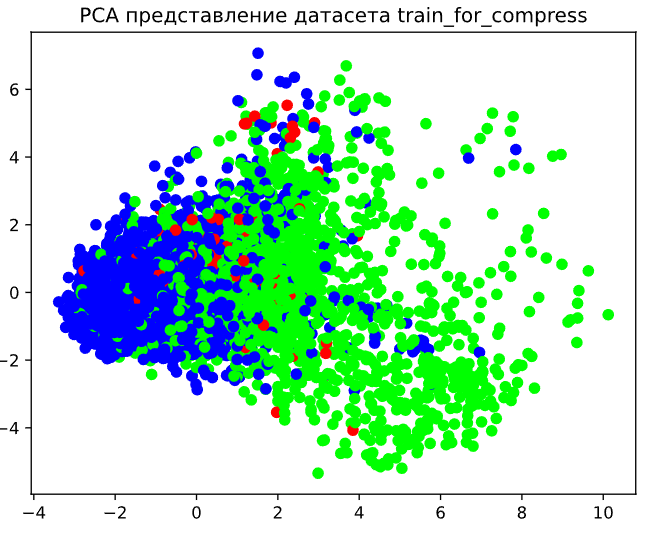

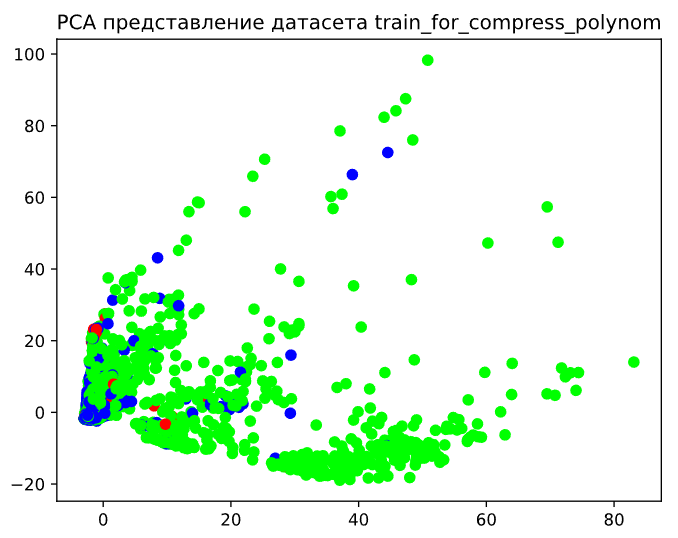

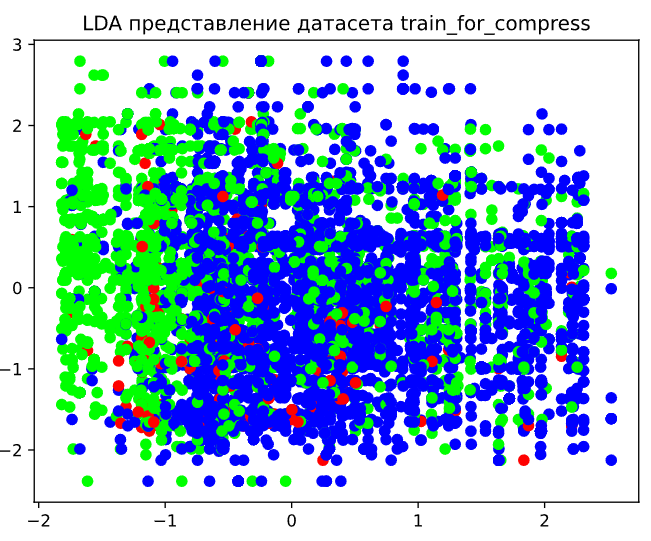

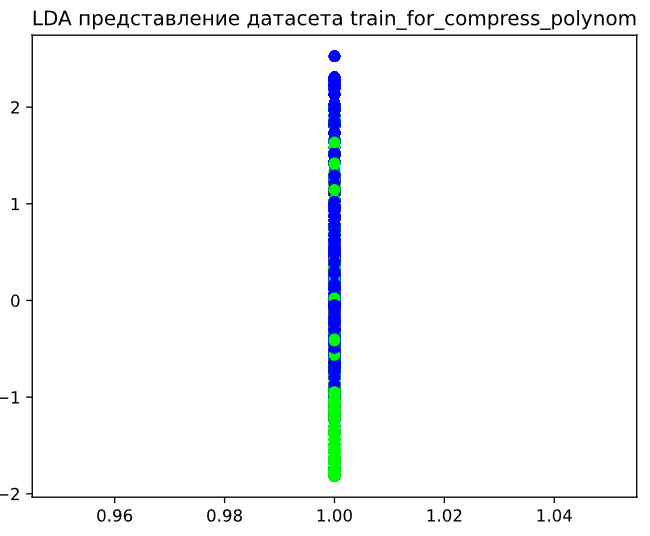

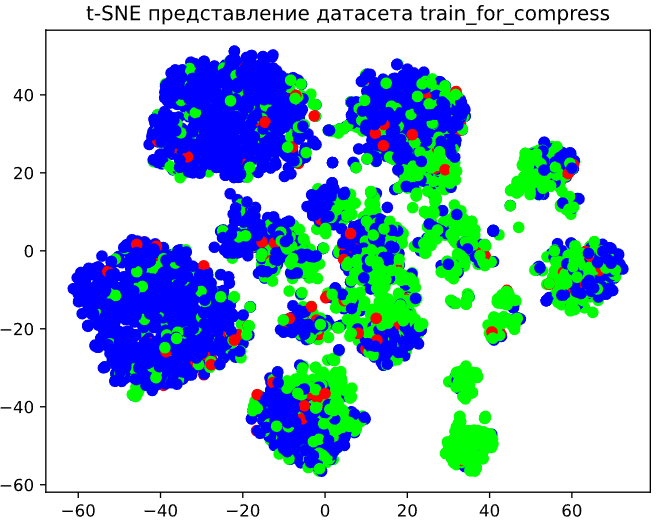

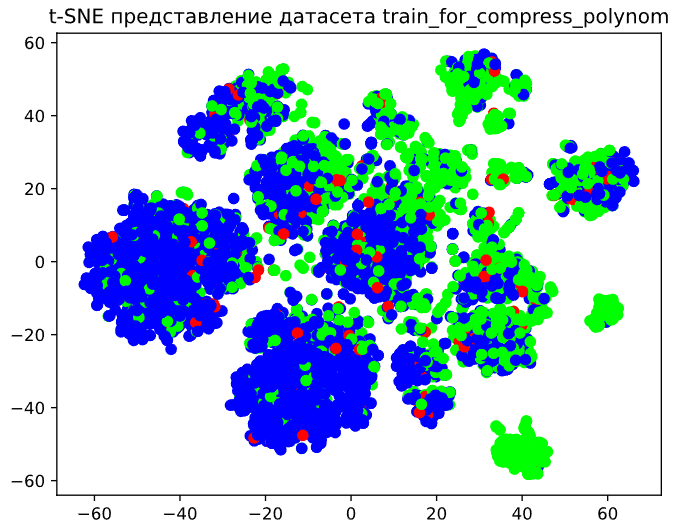

**(6)** В серии сабмитов лучшие и почти одинаковые результаты показали обе отобранные для машинного обучения модели CatBoost и XGBoost, обученные на датасете с исходными признаками **train_features**.

**(7)** Сабмиты, выполненные на специально подготовленных датасетах **train_for_compress** и **train_for_compress_polynom** по итогам экспериментов с подбором числа главных компонент алгоритма **PCA** показали результаты, уступающие обучению моделей на датасете с исходными признаками **train_features**.

**(8)** Самые низкие результаты показали сабмиты, выполненные по результатам обучения машинных моделей с помощью алгоритма сжатия данных **LDA**.

**(9)** Более низкие результаты обучения машинных моделей, полученные с помощью **PCA** и **LDA**, в целом были ожидаемы, так как на серии визуализаций представления данных высокой размерности было отчетливо видно, что классы целевого признака плохо разделяются на группы, накладываются друг на друга.

**(10)** Особо отметим, что применение техник **upsampling** и **downsampling** для устранения дисбаланса классов целевого признака с помощью алгоритмов **SMOTE**, **ADASYN**, **RandomUnderSampling**, неизменно показывало увеличение ошибки в сравнении с обучением на несбалансированных классах. Применение алгоритма **SMOTETomek** в некоторых случаях незначительно улучшало метрику.